# Initialising ML-Ensemble in Basin WITH 2 LEVELS ONLY

### Classes and modules

In [1]:
#Lets have matplotlib "inline"
%matplotlib inline

import os
import sys

#Import packages we need
import numpy as np
import datetime
from IPython.display import display
import copy

#For plotting
import matplotlib
from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.rcParams["lines.color"] = "w"
plt.rcParams["text.color"] = "w"
plt.rcParams["axes.labelcolor"] = "w"
plt.rcParams["xtick.color"] = "w"
plt.rcParams["ytick.color"] = "w"

plt.rcParams["image.origin"] = "lower"

import pycuda.driver as cuda

In [ ]:
import datetime
timestamp = datetime.datetime.now().strftime("%Y-%m-%dT%H_%M_%S")


GPU Ocean-modules:

In [2]:
from gpuocean.utils import IPythonMagic, Common
from gpuocean.SWEsimulators import CDKLM16, ModelErrorKL

In [3]:
%cuda_context_handler gpu_ctx

In [4]:
gpu_stream = cuda.Stream()

Utils

In [5]:
sys.path.insert(0, os.path.abspath(os.path.join(os.getcwd(), '../')))
from utils.BasinInit import *
from utils.BasinPlot import *

### Perturbations

In [6]:
sample_args = {
    "g": 9.81,
    "f": 0.0012,
    }

In [7]:
ls = [9, 10]

In [8]:
args_list = []

for l in ls:
    lvl_grid_args = initGridSpecs(l)
    args_list.append( {
        "nx": lvl_grid_args["nx"],
        "ny": lvl_grid_args["ny"],
        "dx": lvl_grid_args["dx"],
        "dy": lvl_grid_args["dy"],
        "gpu_ctx": gpu_ctx,
        "gpu_stream": gpu_stream,
        "boundary_conditions": Common.BoundaryConditions(2,2,2,2)
        } )

In [9]:
init_model_error_basis_args = {
    "basis_x_start": 1, 
    "basis_x_end": 6,
    "basis_y_start": 2,
    "basis_y_end": 7,

    "kl_decay": 1.25,
    "kl_scaling": 0.18,
}


In [10]:
sim_model_error_basis_args = {
    "basis_x_start": 1, 
    "basis_x_end": 7,
    "basis_y_start": 2,
    "basis_y_end": 8,

    "kl_decay": 1.25,
    "kl_scaling": 0.004,
}

In [11]:
data_args_list = []
for l_idx in range(2):
    data_args_list.append( make_init_steady_state(args_list[l_idx]) )

### Truth

In [12]:
truth_path = "/home/florianb/havvarsel/multilevelDA/scripts/DataAssimilation/BasinSL/2023-05-11T16_43_23"

### Ensemble

In [13]:
from utils.BasinEnsembleInit import *

In [14]:
ML_Nes = [100, 10]

In [15]:
ML_ensemble = initMLensemble(ML_Nes, args_list, data_args_list, sample_args, 
                             init_model_error_basis_args=init_model_error_basis_args, 
                             sim_model_error_basis_args=sim_model_error_basis_args, sim_model_error_time_step=60.0)

0
1


In [16]:
from gpuocean.ensembles import MultiLevelOceanEnsemble
MLOceanEnsemble = MultiLevelOceanEnsemble.MultiLevelOceanEnsemble(ML_ensemble)

### Data Assimilation

In [18]:
def plot_diagnostics():
    _, axs_truth = imshow3( np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy") )
    _, axs_mean  = imshow3(MLOceanEnsemble.estimate(np.mean))
    _, axs_var   = imshow3var(MLOceanEnsemble.estimate(np.var), eta_vlim=0.01, huv_vlim=50)


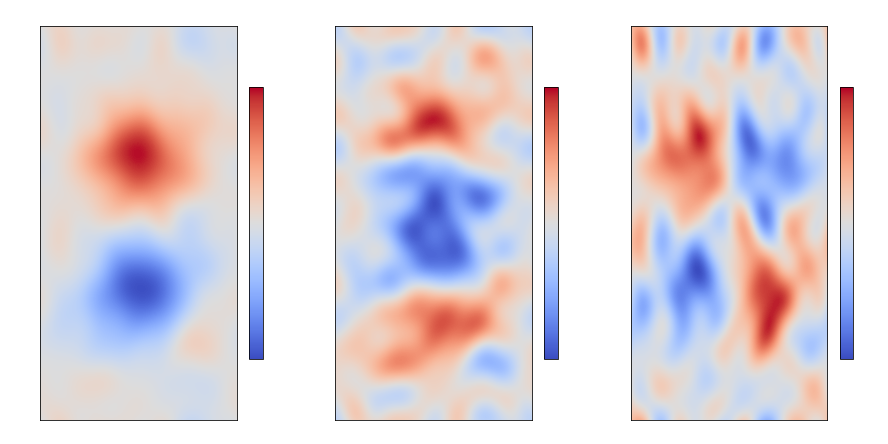

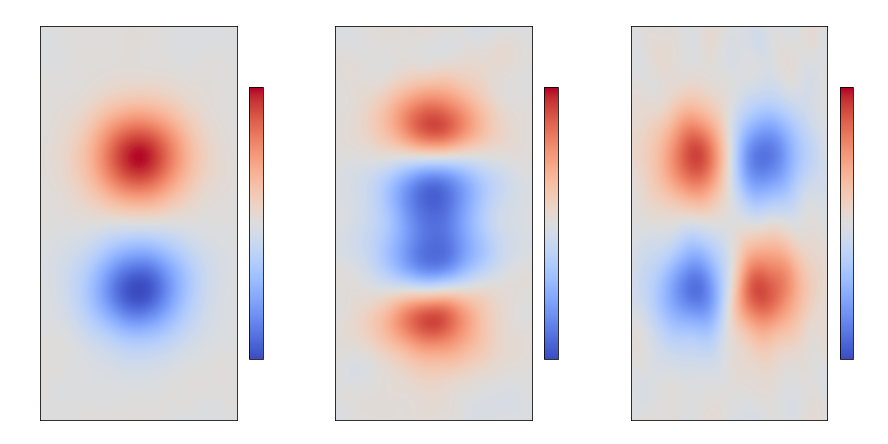

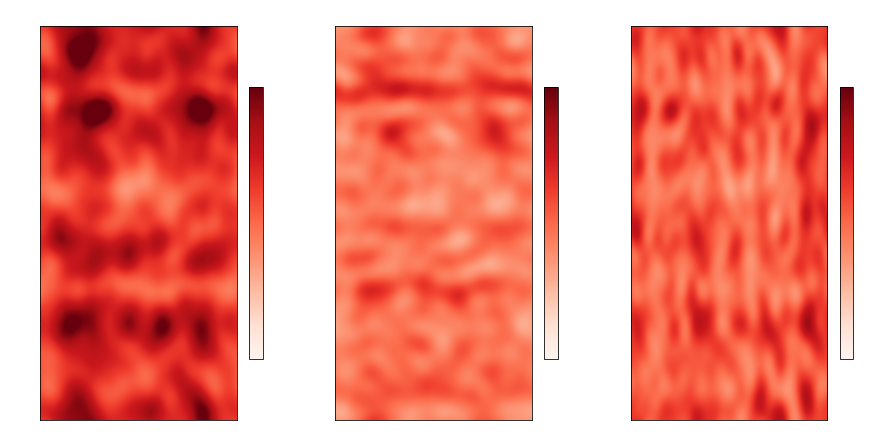

In [19]:
plot_diagnostics()

In [20]:
MLOceanEnsemble.stepToObservation(300)

prior = copy.deepcopy(MLOceanEnsemble.download())

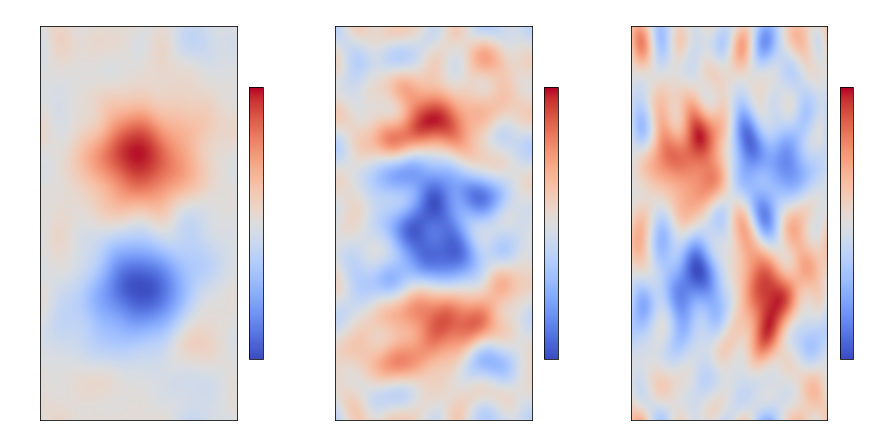

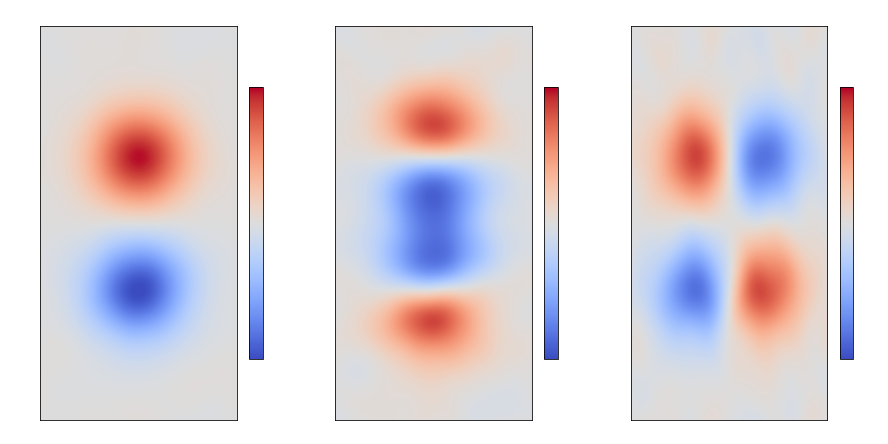

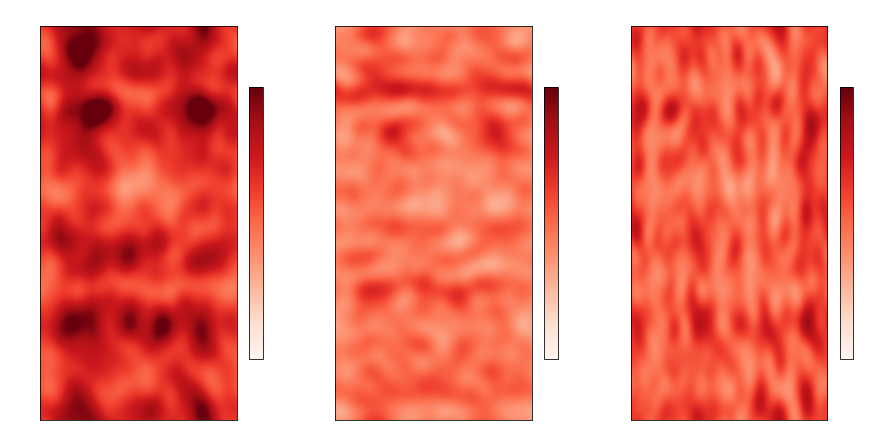

In [21]:
plot_diagnostics()

In [22]:
from gpuocean.dataassimilation import MLEnKFOcean
MLEnKF = MLEnKFOcean.MLEnKFOcean(MLOceanEnsemble)

In [23]:
Hxs = [ 500,  300,  700,  300,  700]
Hys = [1000,  800,  800, 1200, 1200]
R = [5e-5, 5e-3, 5e-3]

In [24]:
r = 2.5e4
relax_factor = 0.25

In [25]:
precomp_GCs = []
for Hx, Hy in zip(Hxs, Hys):
    obs_x = MLEnKF.X[0,Hx]
    obs_y = MLEnKF.Y[Hy,0]

    precomp_GCs.append( MLEnKF.GCweights(obs_x, obs_y, r) )

In [26]:
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_0", prior[0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_0", prior[1][0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_1", prior[1][1])

true_eta, true_hu, true_hv = np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy")

for h, [Hx, Hy] in enumerate(zip(Hxs, Hys)):
    obs = [true_eta[Hy,Hx], true_hu[Hy,Hx], true_hv[Hy,Hx]] + np.random.normal(0,R)

    MLEnKF.assimilate(MLOceanEnsemble, obs, Hx, Hy, R, 
                        r=r, obs_var=slice(1,3), relax_factor=relax_factor, 
                        min_localisation_level=0, precomp_GC=precomp_GCs[h])


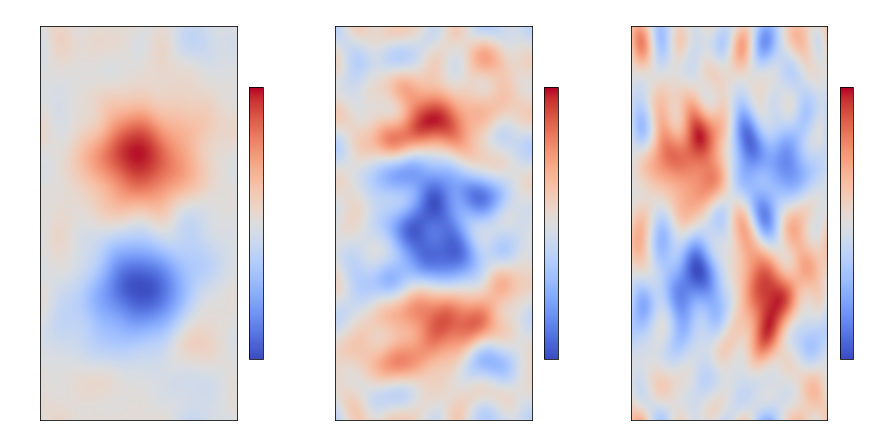

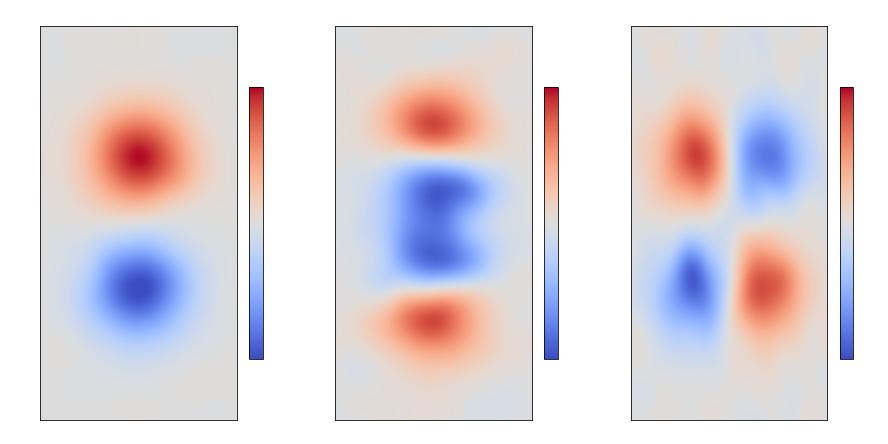

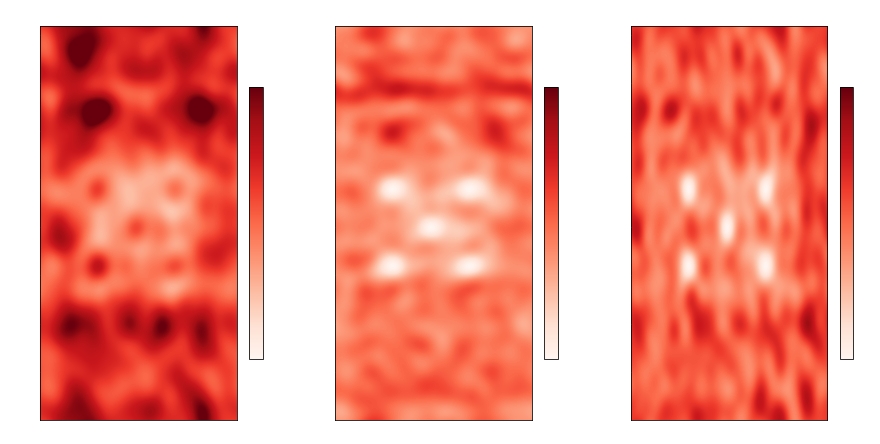

In [28]:
plot_diagnostics()

Repeat DA loop

600.0


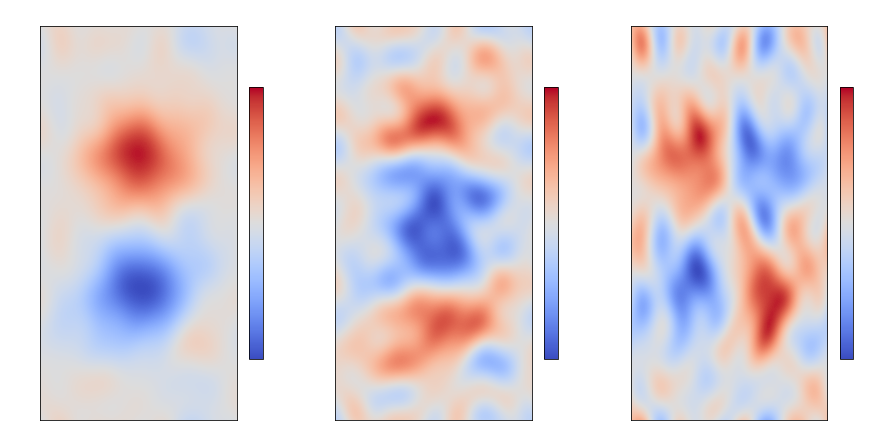

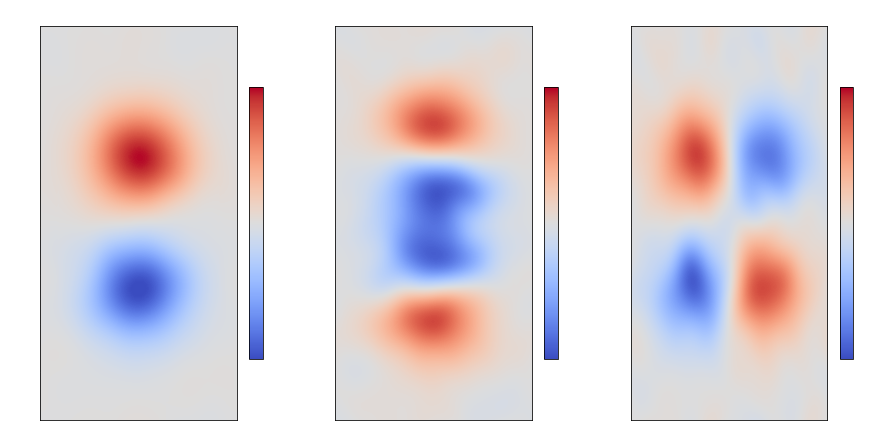

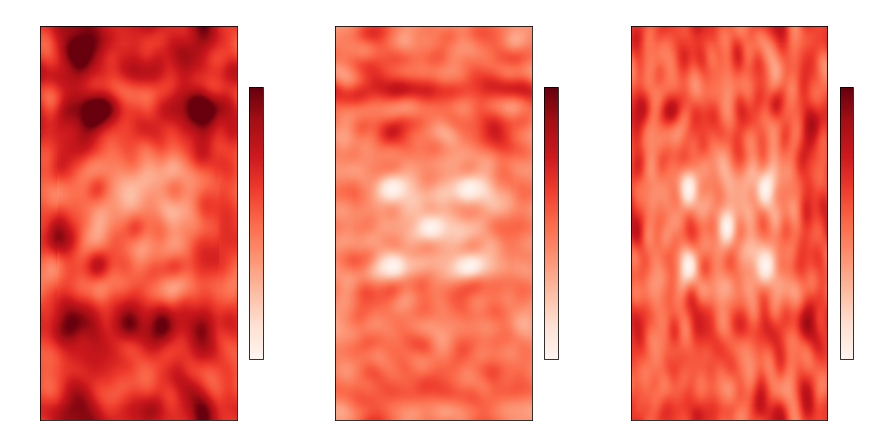

In [29]:
MLOceanEnsemble.stepToObservation(MLOceanEnsemble.t + 300)

print(MLOceanEnsemble.t)

prior = copy.deepcopy(MLOceanEnsemble.download())

plot_diagnostics()


600.0


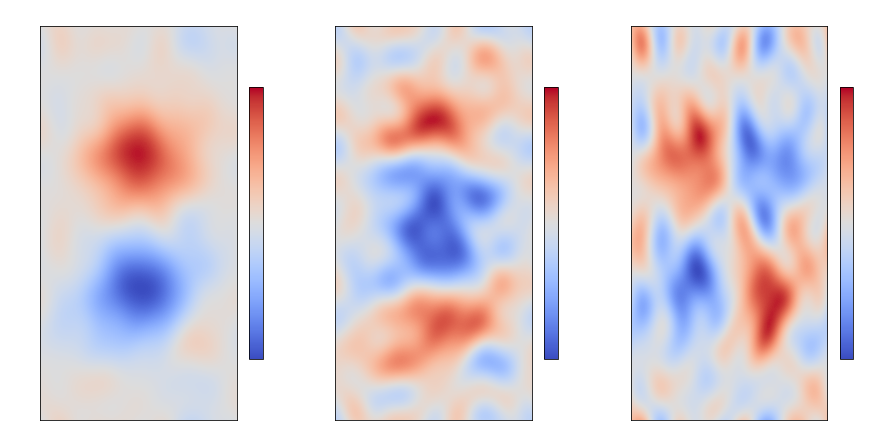

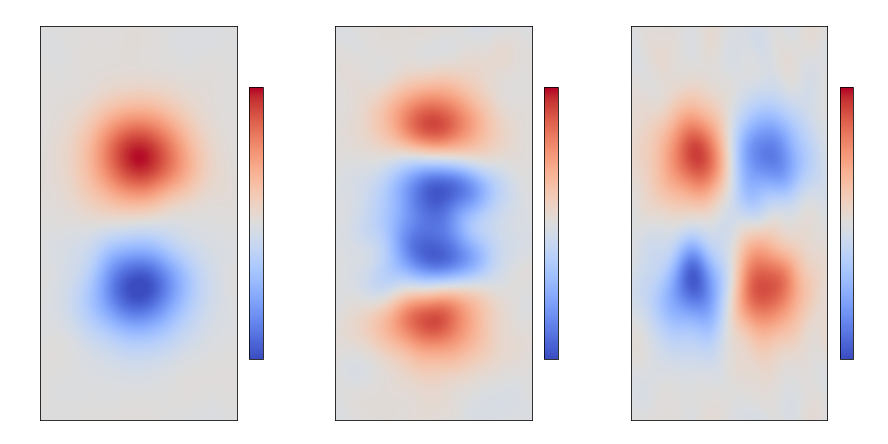

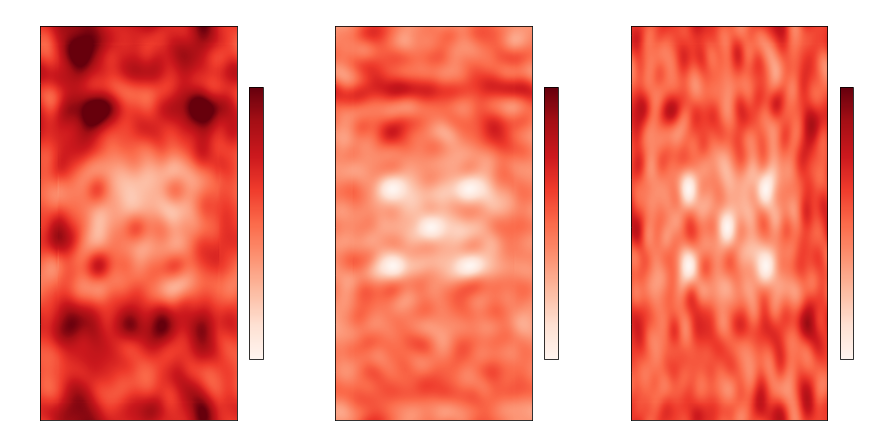

In [30]:
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_0", prior[0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_0", prior[1][0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_1", prior[1][1])

true_eta, true_hu, true_hv = np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy")

for h, [Hx, Hy] in enumerate(zip(Hxs, Hys)):
    obs = [true_eta[Hy,Hx], true_hu[Hy,Hx], true_hv[Hy,Hx]] + np.random.normal(0,R)

    MLEnKF.assimilate(MLOceanEnsemble, obs, Hx, Hy, R, 
                        r=r, obs_var=slice(1,3), relax_factor=relax_factor, 
                        min_localisation_level=0, precomp_GC=precomp_GCs[h])
    
print(MLOceanEnsemble.t)

plot_diagnostics()

900.0


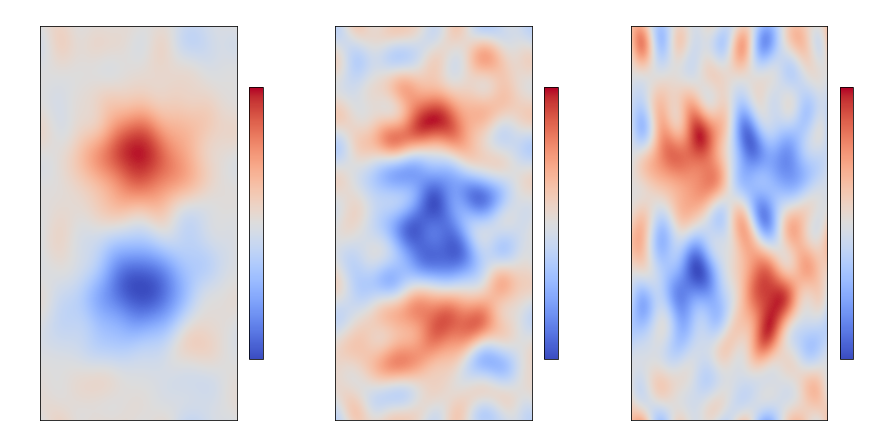

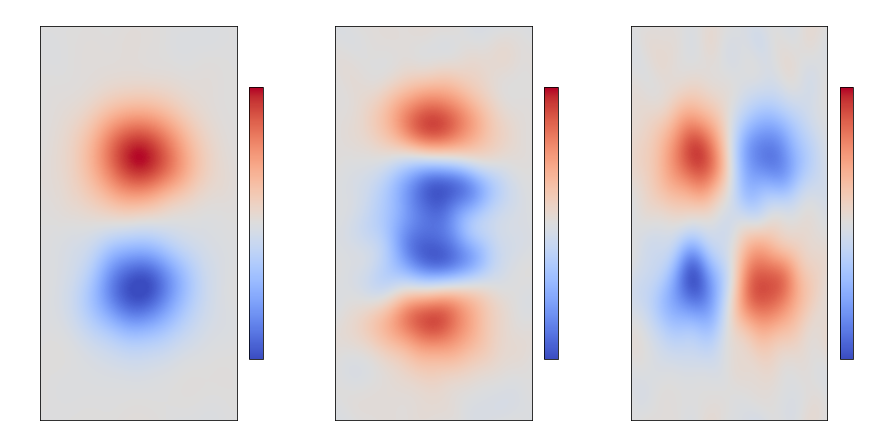

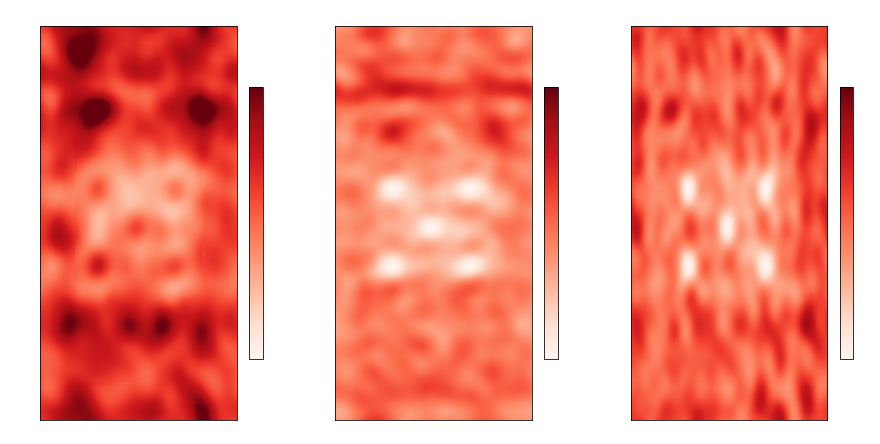

In [31]:
MLOceanEnsemble.stepToObservation(MLOceanEnsemble.t + 300)

print(MLOceanEnsemble.t)

prior = copy.deepcopy(MLOceanEnsemble.download())

plot_diagnostics()


900.0


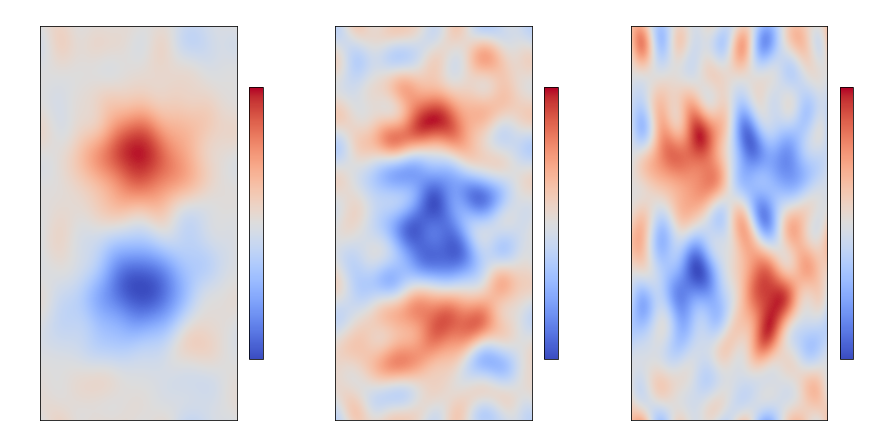

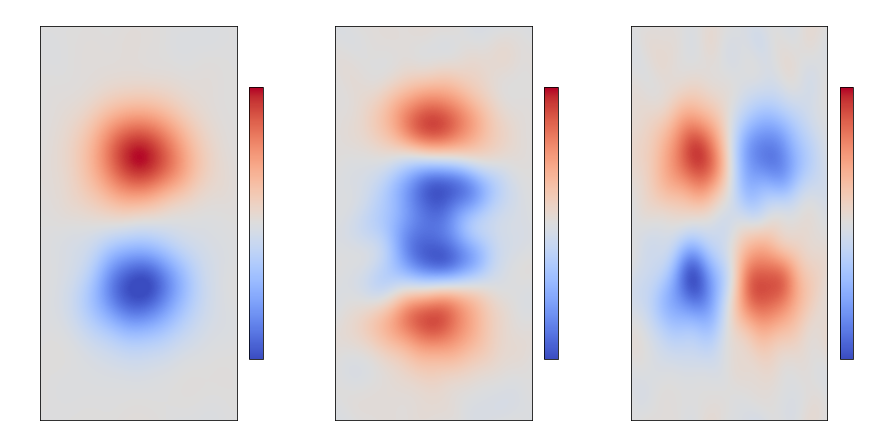

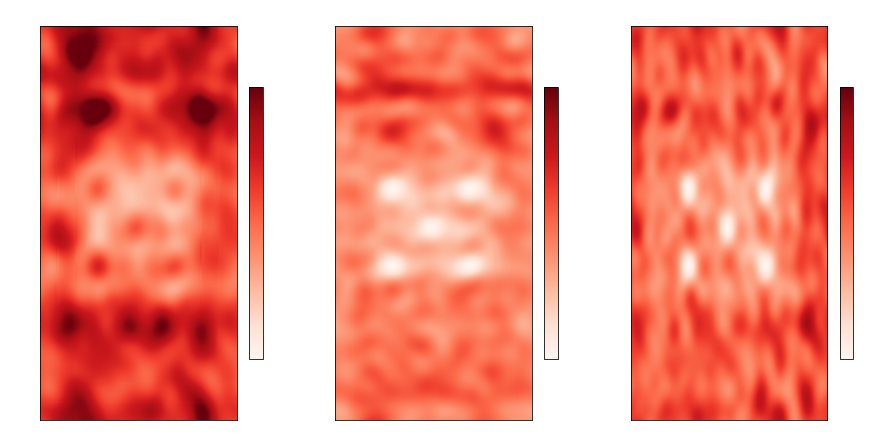

In [32]:
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_0", prior[0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_0", prior[1][0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_1", prior[1][1])

true_eta, true_hu, true_hv = np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy")

for h, [Hx, Hy] in enumerate(zip(Hxs, Hys)):
    obs = [true_eta[Hy,Hx], true_hu[Hy,Hx], true_hv[Hy,Hx]] + np.random.normal(0,R)

    MLEnKF.assimilate(MLOceanEnsemble, obs, Hx, Hy, R, 
                        r=r, obs_var=slice(1,3), relax_factor=relax_factor, 
                        min_localisation_level=0, precomp_GC=precomp_GCs[h])
    
print(MLOceanEnsemble.t)

plot_diagnostics()

1200.0


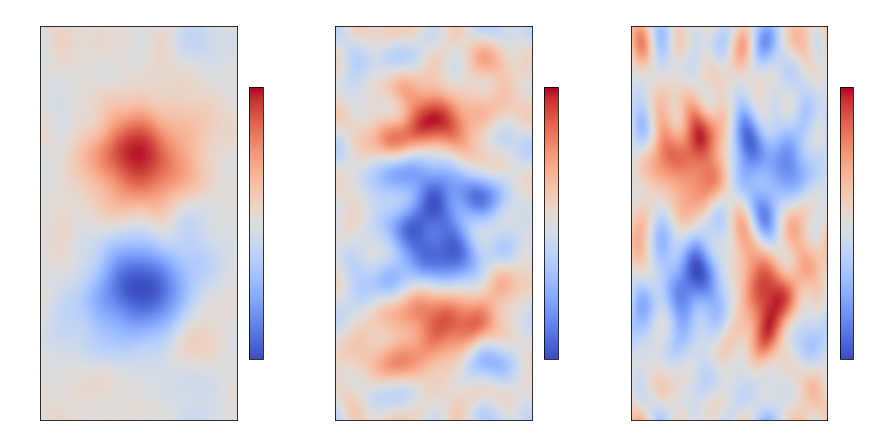

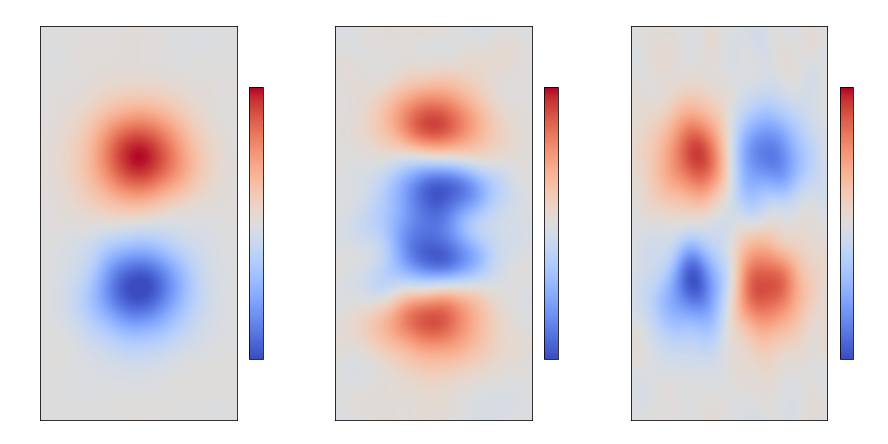

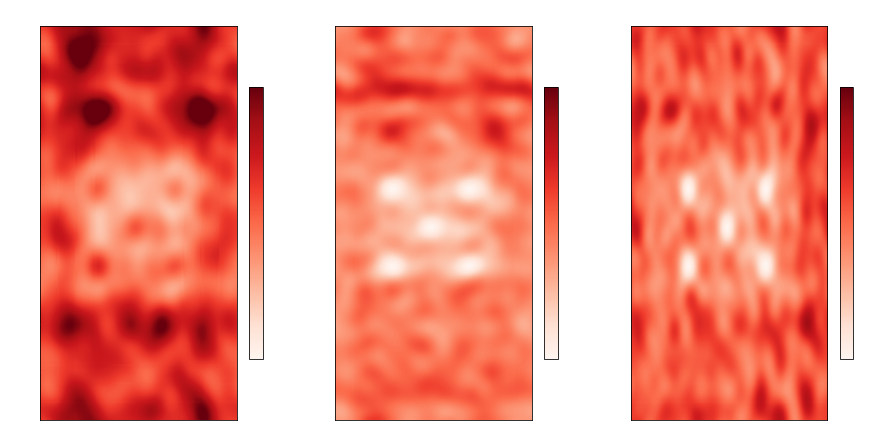

In [33]:
MLOceanEnsemble.stepToObservation(MLOceanEnsemble.t + 300)

print(MLOceanEnsemble.t)

prior = copy.deepcopy(MLOceanEnsemble.download())

plot_diagnostics()


1200.0


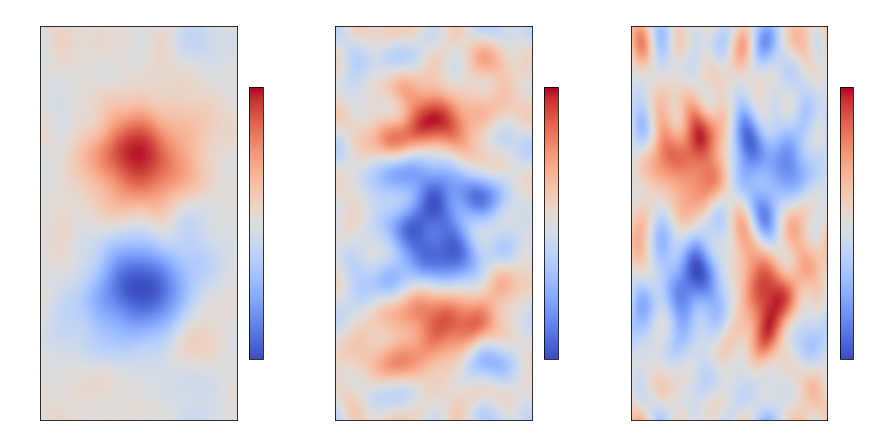

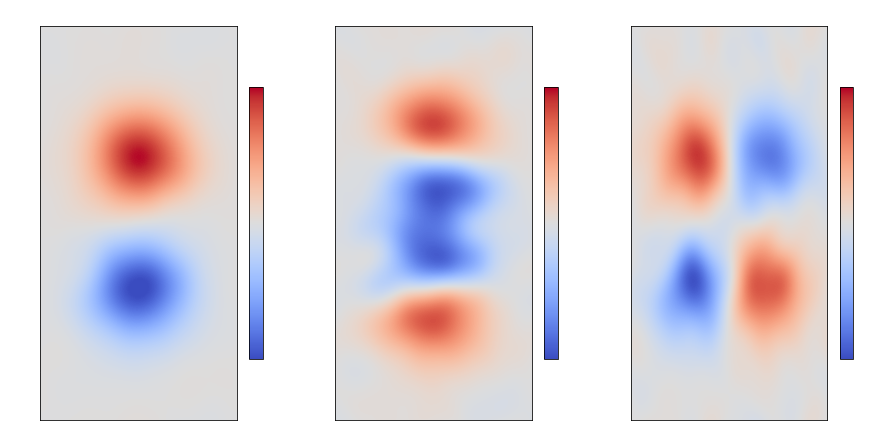

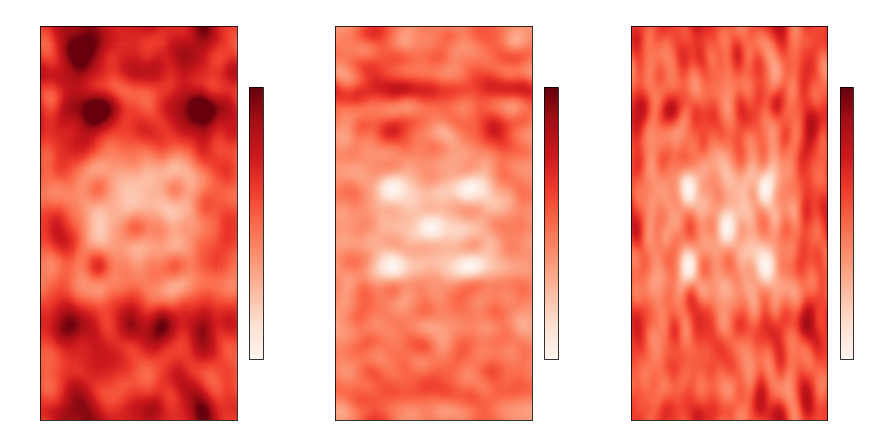

In [34]:
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_0", prior[0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_0", prior[1][0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_1", prior[1][1])

true_eta, true_hu, true_hv = np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy")

for h, [Hx, Hy] in enumerate(zip(Hxs, Hys)):
    obs = [true_eta[Hy,Hx], true_hu[Hy,Hx], true_hv[Hy,Hx]] + np.random.normal(0,R)

    MLEnKF.assimilate(MLOceanEnsemble, obs, Hx, Hy, R, 
                        r=r, obs_var=slice(1,3), relax_factor=relax_factor, 
                        min_localisation_level=0, precomp_GC=precomp_GCs[h])
    
print(MLOceanEnsemble.t)

plot_diagnostics()

1500.0


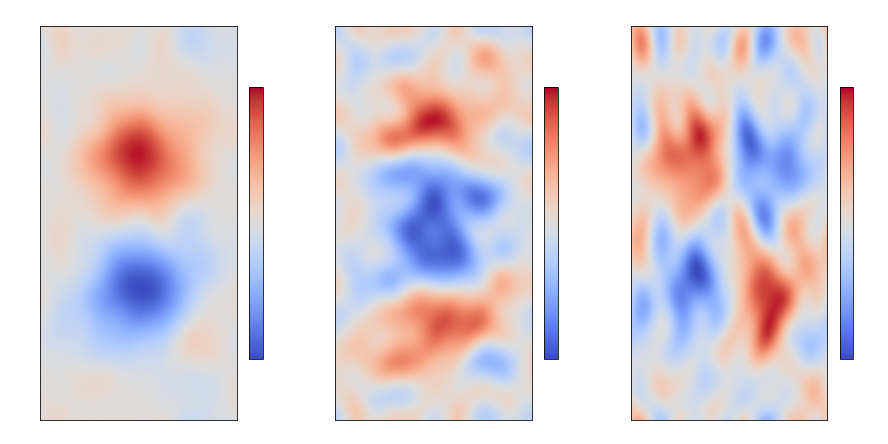

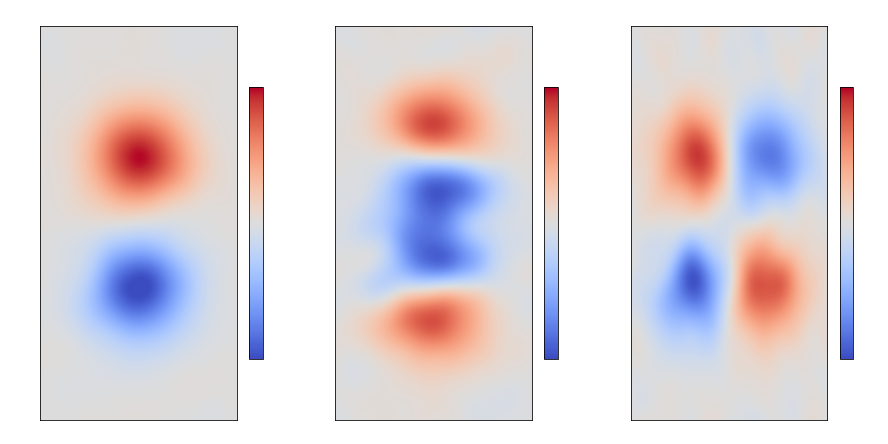

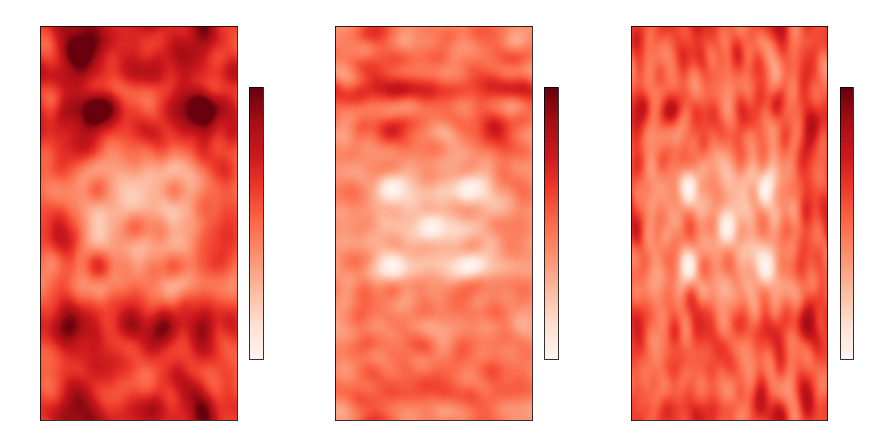

In [35]:
MLOceanEnsemble.stepToObservation(MLOceanEnsemble.t + 300)

print(MLOceanEnsemble.t)

prior = copy.deepcopy(MLOceanEnsemble.download())

plot_diagnostics()

1500.0


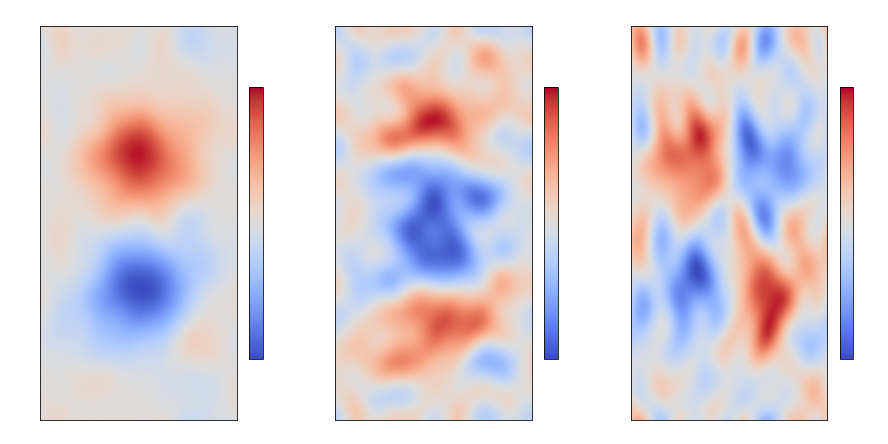

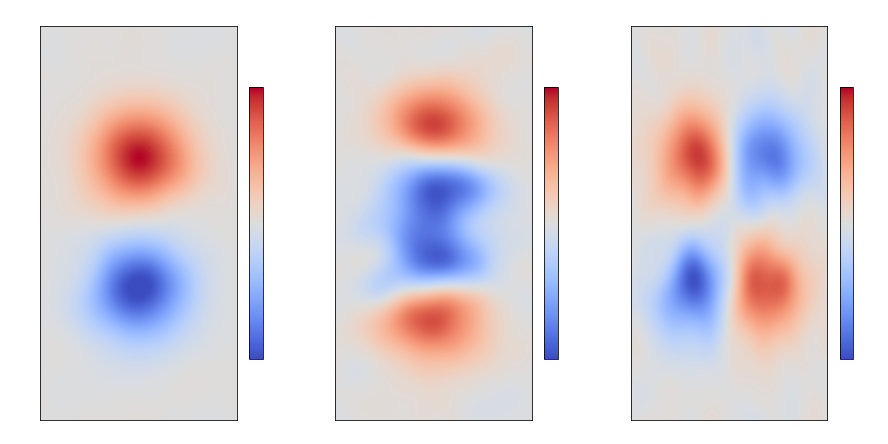

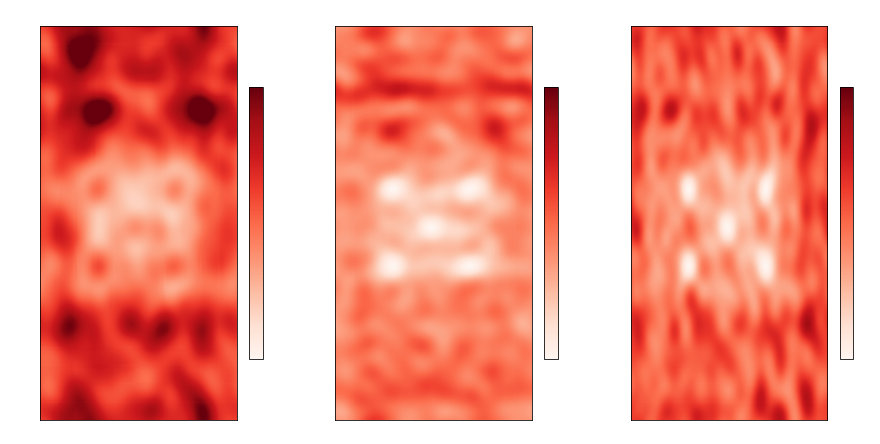

In [36]:
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_0", prior[0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_0", prior[1][0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_1", prior[1][1])

true_eta, true_hu, true_hv = np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy")

for h, [Hx, Hy] in enumerate(zip(Hxs, Hys)):
    obs = [true_eta[Hy,Hx], true_hu[Hy,Hx], true_hv[Hy,Hx]] + np.random.normal(0,R)

    MLEnKF.assimilate(MLOceanEnsemble, obs, Hx, Hy, R, 
                        r=r, obs_var=slice(1,3), relax_factor=relax_factor, 
                        min_localisation_level=0, precomp_GC=precomp_GCs[h])
    
print(MLOceanEnsemble.t)

plot_diagnostics()

1800.0


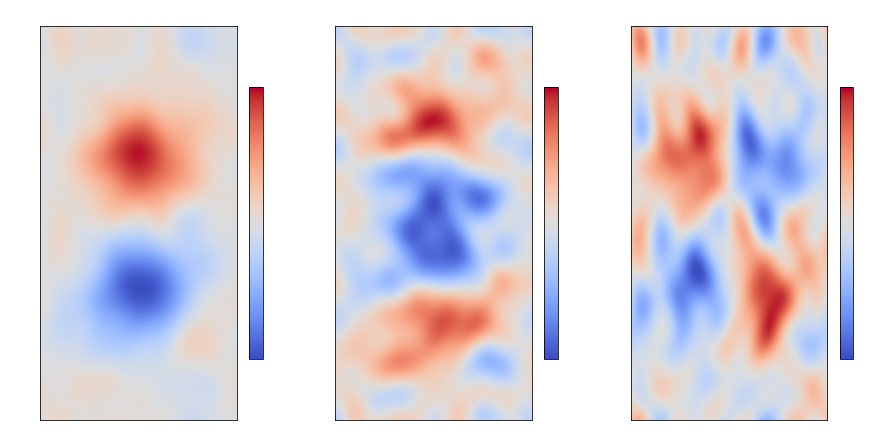

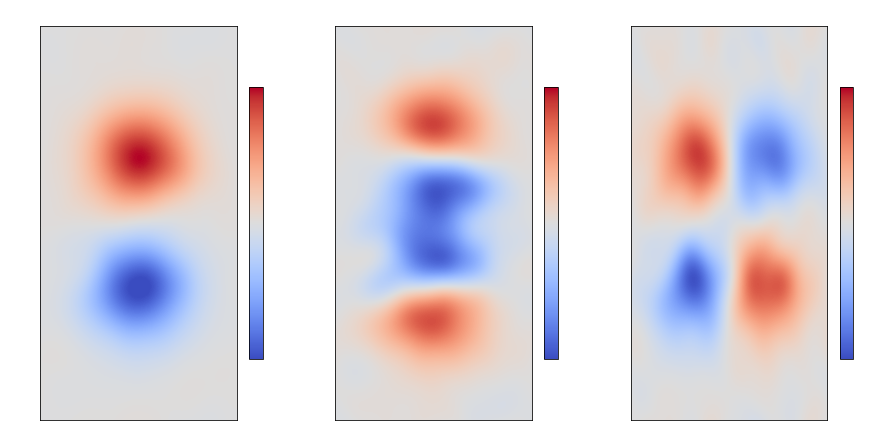

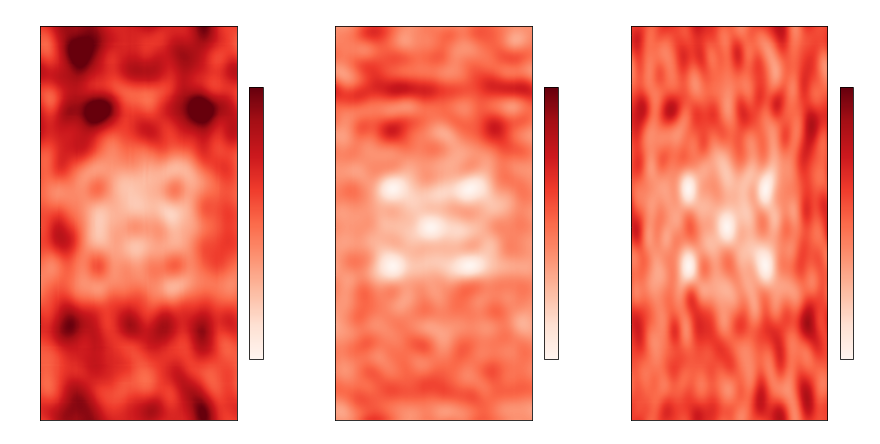

In [37]:
MLOceanEnsemble.stepToObservation(MLOceanEnsemble.t + 300)

print(MLOceanEnsemble.t)

prior = copy.deepcopy(MLOceanEnsemble.download())

plot_diagnostics()


1800.0


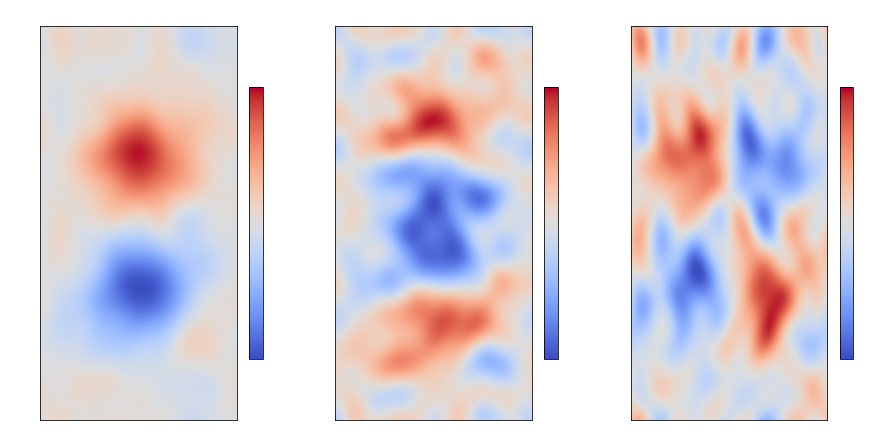

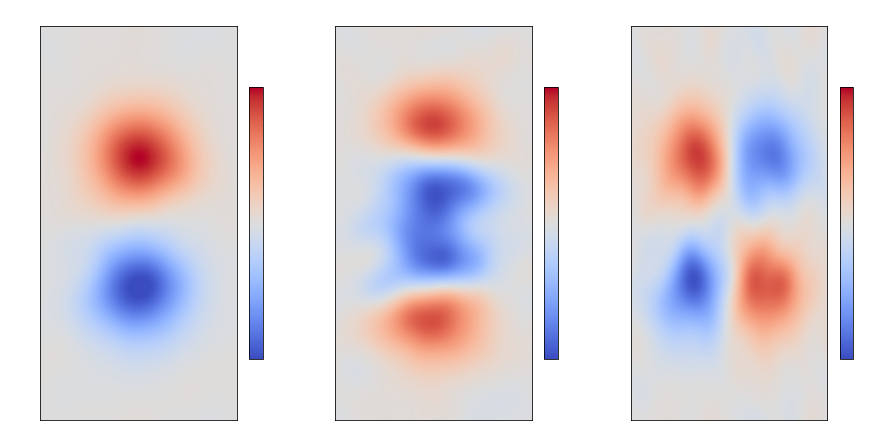

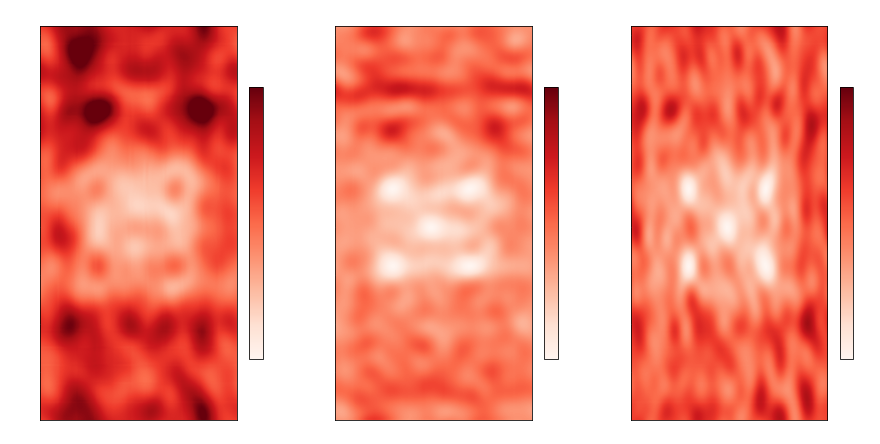

In [38]:
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_0", prior[0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_0", prior[1][0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_1", prior[1][1])

true_eta, true_hu, true_hv = np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy")

for h, [Hx, Hy] in enumerate(zip(Hxs, Hys)):
    obs = [true_eta[Hy,Hx], true_hu[Hy,Hx], true_hv[Hy,Hx]] + np.random.normal(0,R)

    MLEnKF.assimilate(MLOceanEnsemble, obs, Hx, Hy, R, 
                        r=r, obs_var=slice(1,3), relax_factor=relax_factor, 
                        min_localisation_level=0, precomp_GC=precomp_GCs[h])
    
print(MLOceanEnsemble.t)

plot_diagnostics()

2100.0


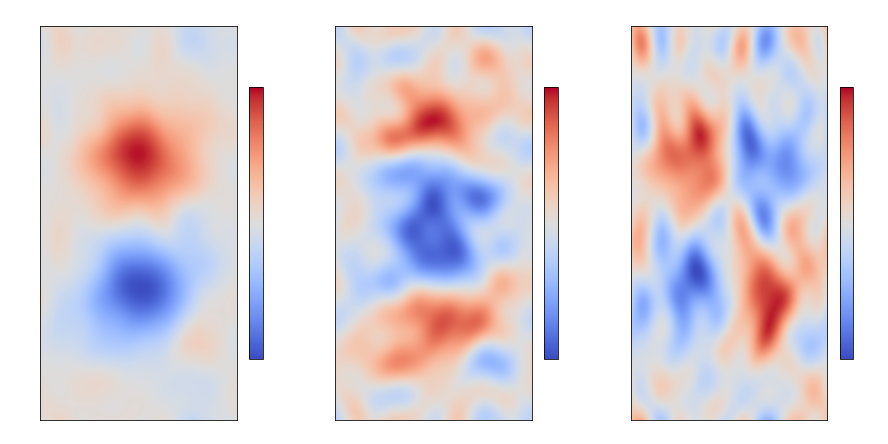

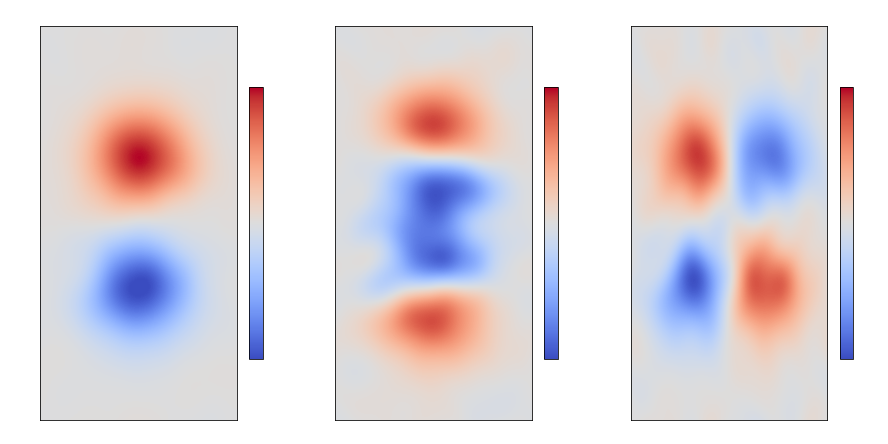

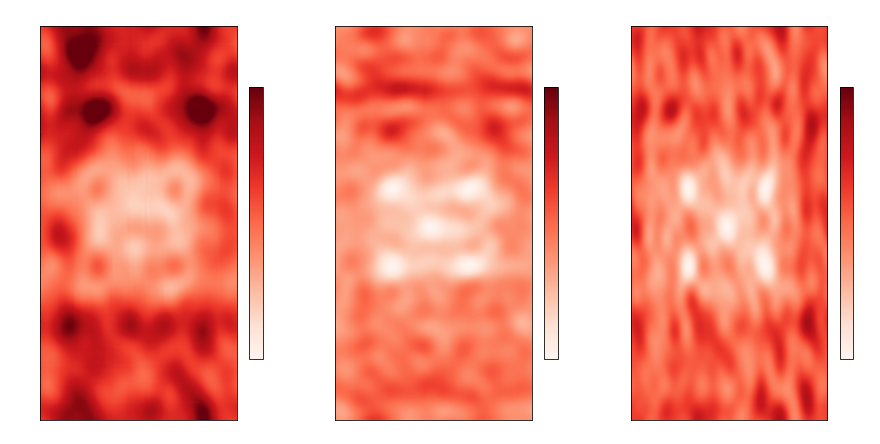

In [39]:
MLOceanEnsemble.stepToObservation(MLOceanEnsemble.t + 300)

print(MLOceanEnsemble.t)

prior = copy.deepcopy(MLOceanEnsemble.download())

plot_diagnostics()

2100.0


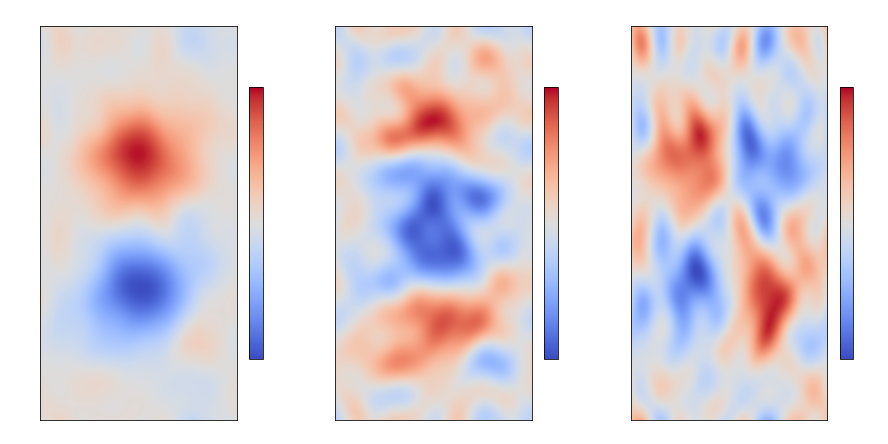

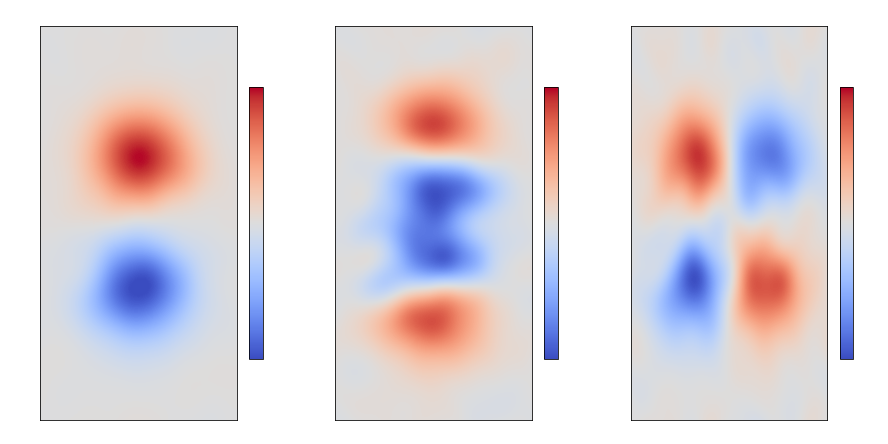

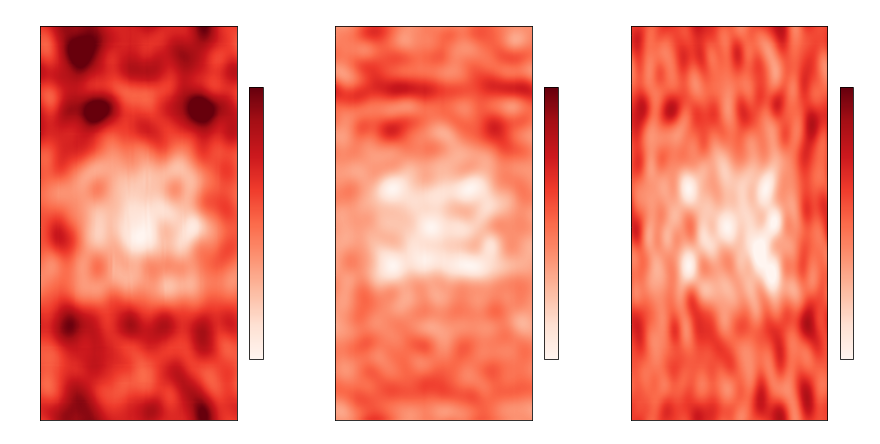

In [40]:
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_0", prior[0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_0", prior[1][0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_1", prior[1][1])

true_eta, true_hu, true_hv = np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy")

for h, [Hx, Hy] in enumerate(zip(Hxs, Hys)):
    obs = [true_eta[Hy,Hx], true_hu[Hy,Hx], true_hv[Hy,Hx]] + np.random.normal(0,R)

    MLEnKF.assimilate(MLOceanEnsemble, obs, Hx, Hy, R, 
                        r=r, obs_var=slice(1,3), relax_factor=relax_factor, 
                        min_localisation_level=0, precomp_GC=precomp_GCs[h])
    
print(MLOceanEnsemble.t)

plot_diagnostics()

2400.0


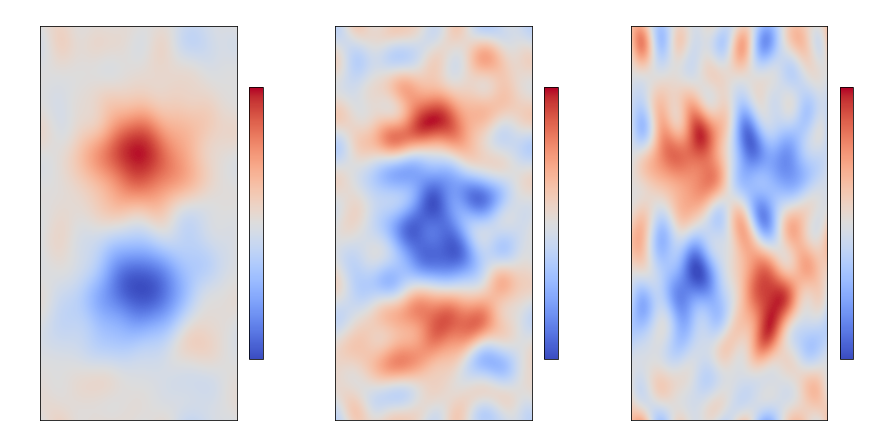

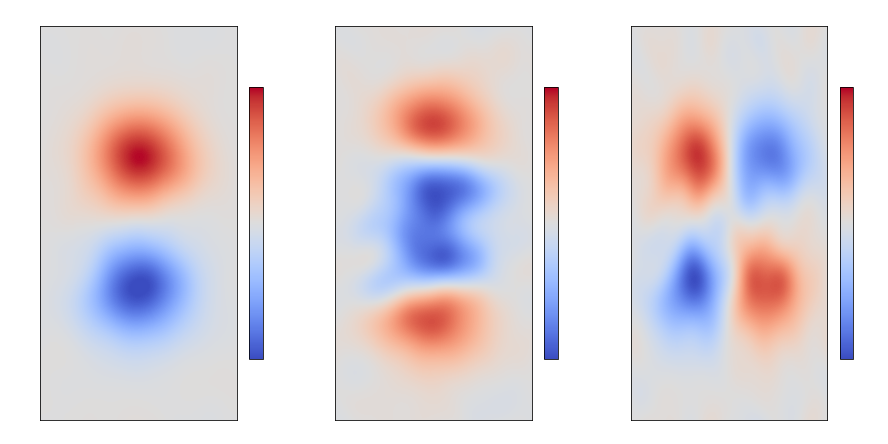

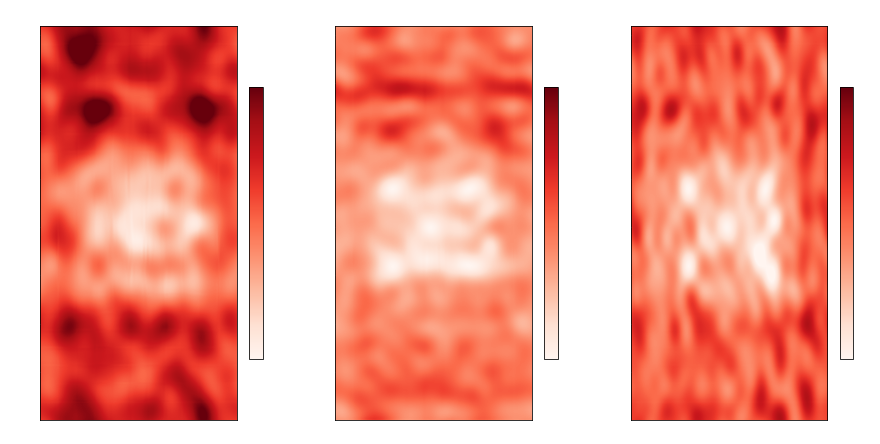

In [41]:
MLOceanEnsemble.stepToObservation(MLOceanEnsemble.t + 300)

print(MLOceanEnsemble.t)

prior = copy.deepcopy(MLOceanEnsemble.download())

plot_diagnostics()

2400.0


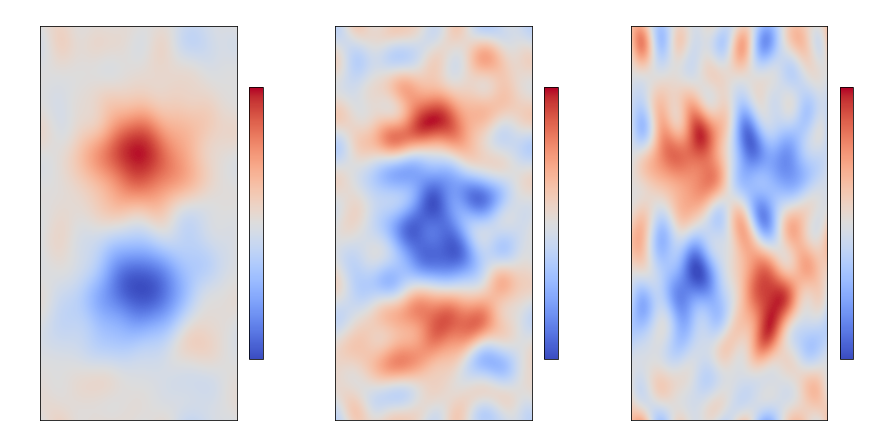

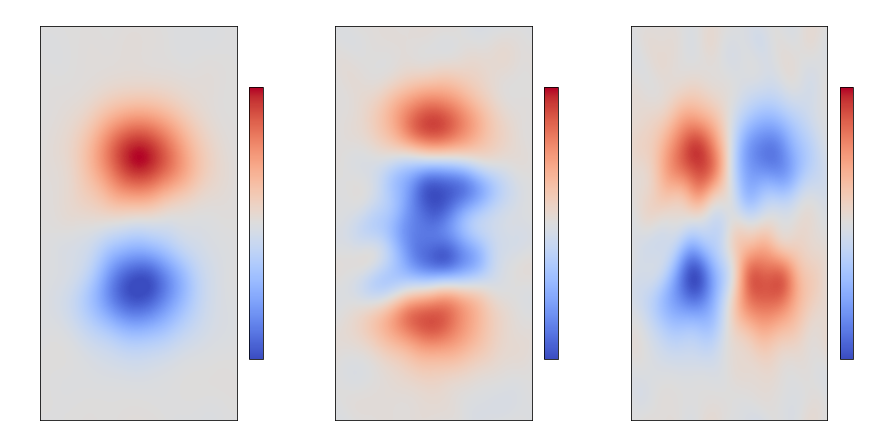

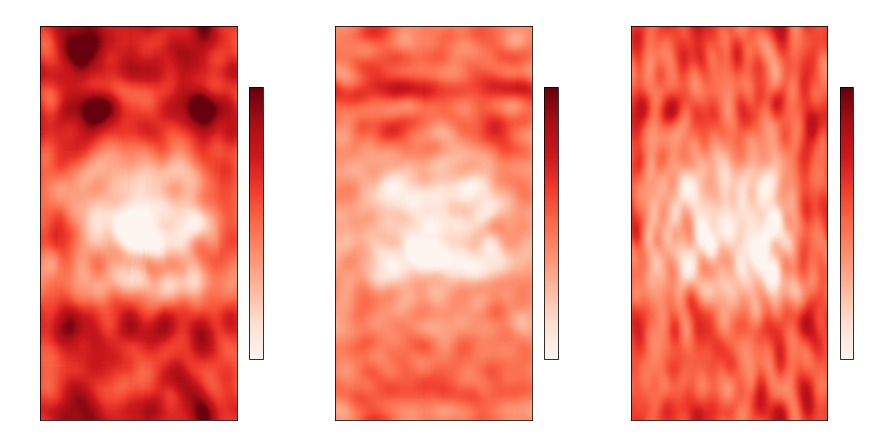

In [42]:
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_0", prior[0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_0", prior[1][0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_1", prior[1][1])

true_eta, true_hu, true_hv = np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy")

for h, [Hx, Hy] in enumerate(zip(Hxs, Hys)):
    obs = [true_eta[Hy,Hx], true_hu[Hy,Hx], true_hv[Hy,Hx]] + np.random.normal(0,R)

    MLEnKF.assimilate(MLOceanEnsemble, obs, Hx, Hy, R, 
                        r=r, obs_var=slice(1,3), relax_factor=relax_factor, 
                        min_localisation_level=0, precomp_GC=precomp_GCs[h])
    
print(MLOceanEnsemble.t)

plot_diagnostics()

2700.0


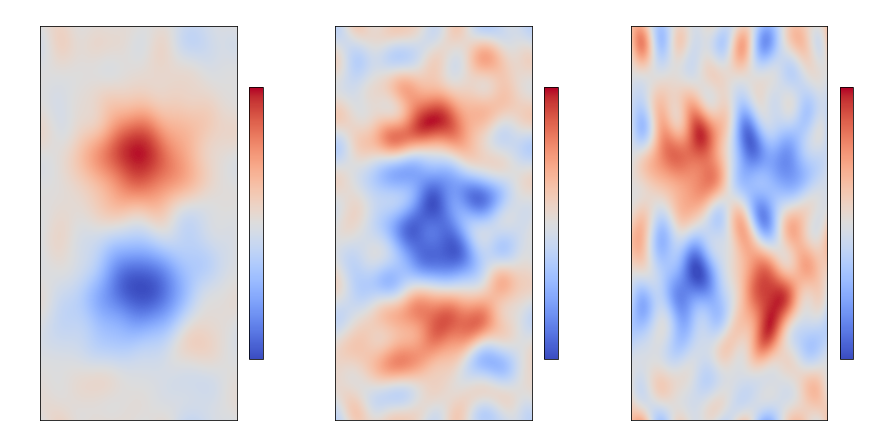

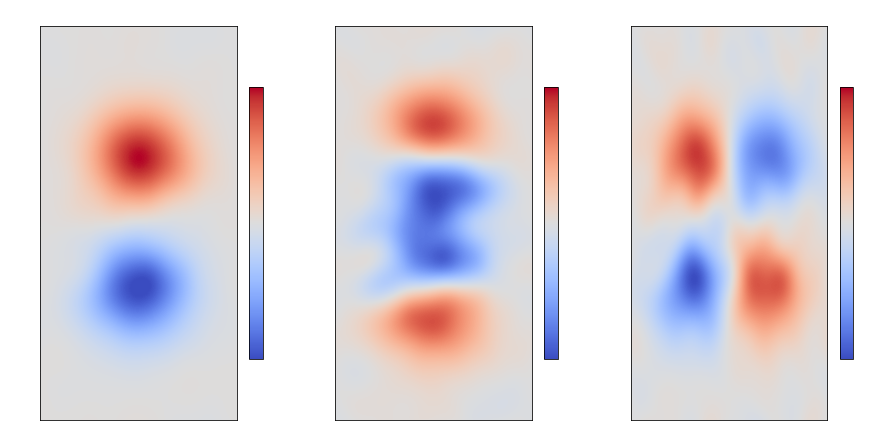

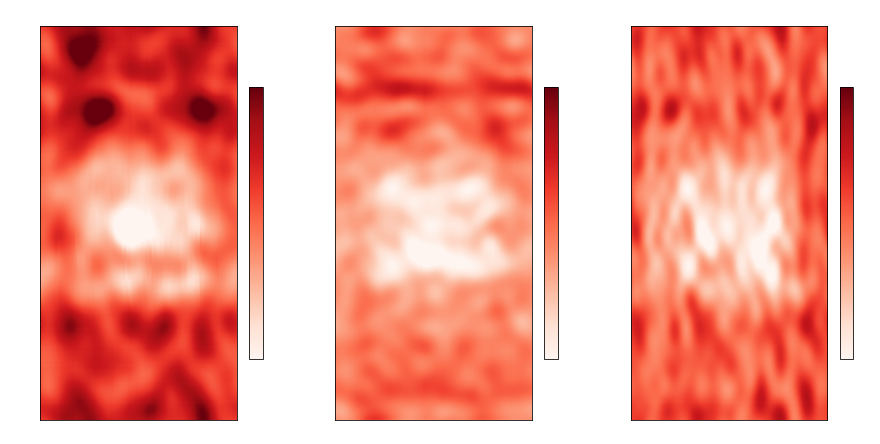

In [43]:
MLOceanEnsemble.stepToObservation(MLOceanEnsemble.t + 300)

print(MLOceanEnsemble.t)

prior = copy.deepcopy(MLOceanEnsemble.download())

plot_diagnostics()

In [70]:
np.save("dumpBadPrior0", prior[0])
np.save("dumpBadPrior1_0", prior[1][0])
np.save("dumpBadPrior1_1", prior[1][1])

In [45]:
MLOceanEnsemble.upload(prior)

2700.0


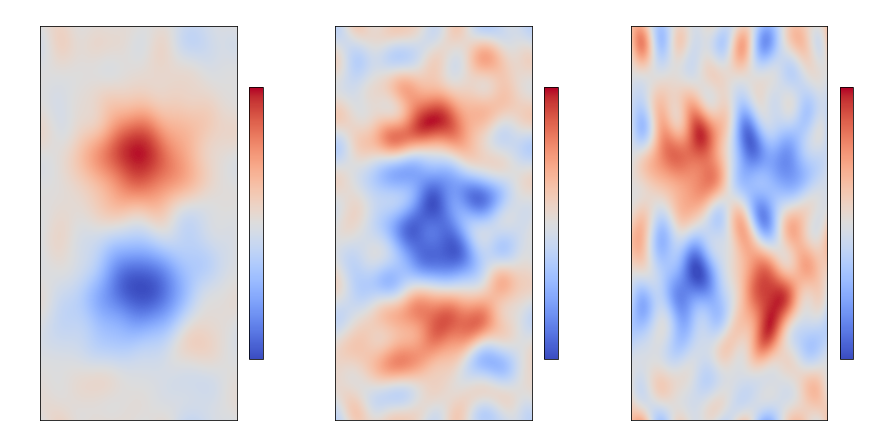

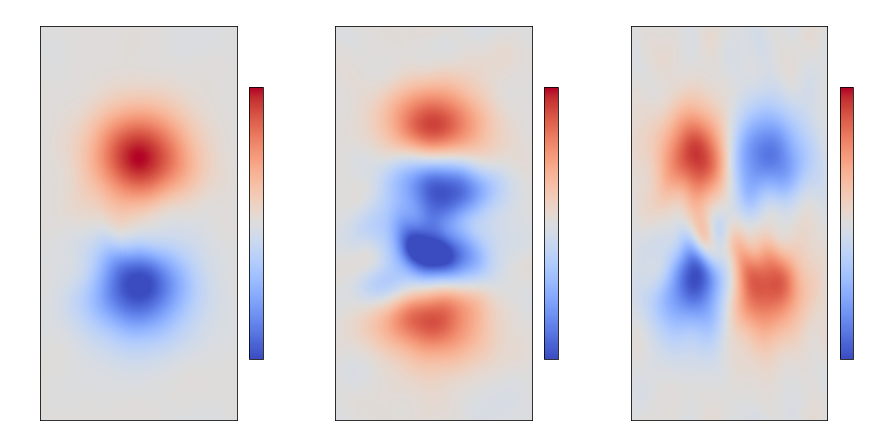

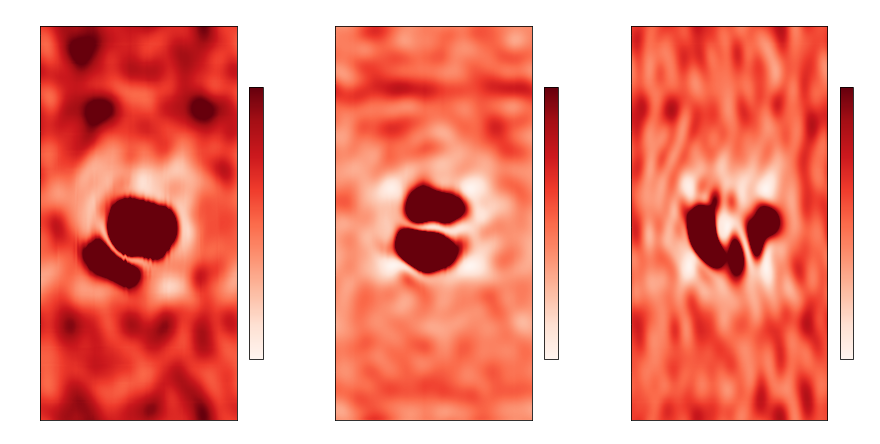

In [46]:
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_0", prior[0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_0", prior[1][0])
np.save(timestamp+"_2levelEnsemble_"+str(int(MLOceanEnsemble.t))+"_1_1", prior[1][1])

true_eta, true_hu, true_hv = np.load(truth_path+"/truth_"+str(int(MLOceanEnsemble.t))+".npy")

for h, [Hx, Hy] in enumerate(zip(Hxs, Hys)):
    obs = [true_eta[Hy,Hx], true_hu[Hy,Hx], true_hv[Hy,Hx]] + np.random.normal(0,R)

    ML_K = MLEnKF.assimilate(MLOceanEnsemble, obs, Hx, Hy, R, 
                        r=r, obs_var=slice(1,3), relax_factor=relax_factor, 
                        min_localisation_level=0, precomp_GC=precomp_GCs[h])
    
print(MLOceanEnsemble.t)

plot_diagnostics()

(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

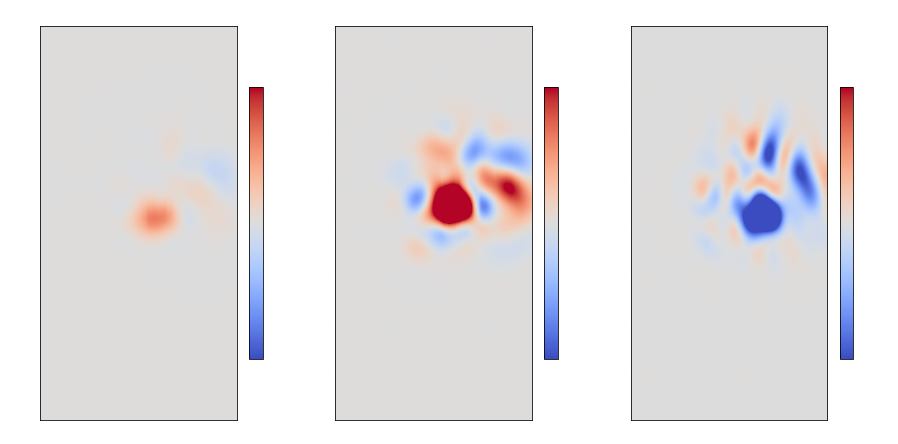

In [52]:
imshow3(ML_K[:,0].reshape(3, 2048, 1024), eta_vlim=0.1, huv_vlim=1)

(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

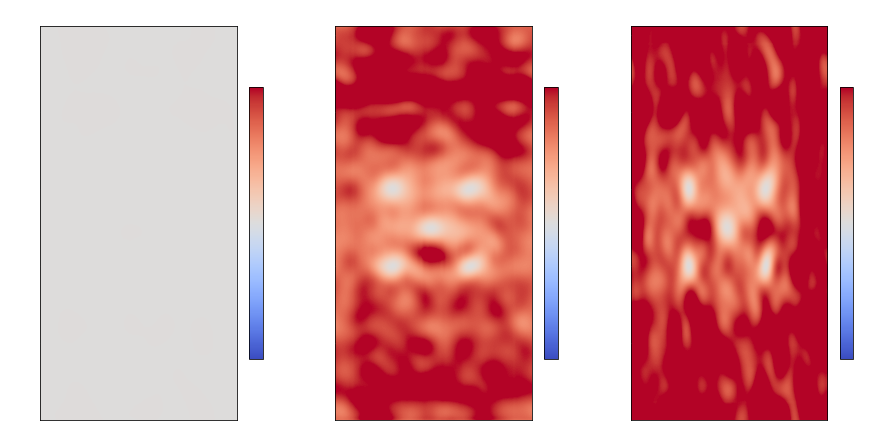

In [55]:
imshow3(np.var(prior[0], axis=-1))

(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

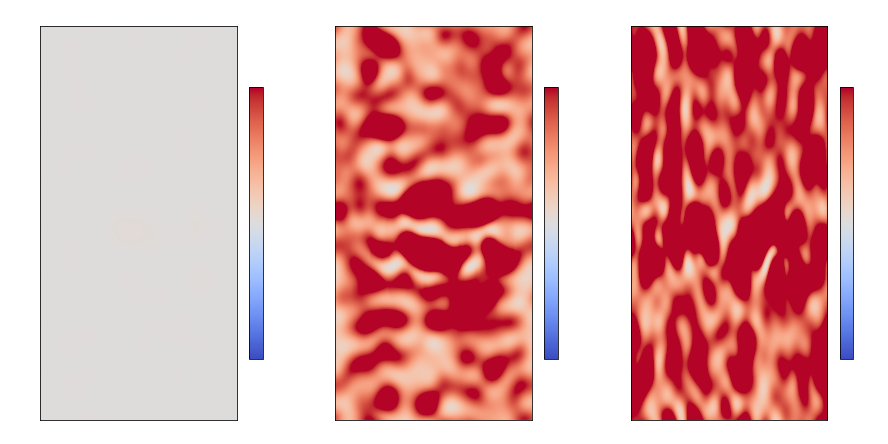

In [58]:
imshow3(np.var(prior[1][0], axis=-1))

In [59]:
obs_var = slice(1,3)

In [106]:
## Prior        
ML_state = MLOceanEnsemble.download()


## Easy access to frequently used information
Nes = MLOceanEnsemble.Nes
numLevels = MLOceanEnsemble.numLevels

# Observation indices per level: 
obs_idxs = [list(np.unravel_index(np.argmin((MLEnKF.lvl_X[0] - MLEnKF.X[0,Hx])**2 + (MLEnKF.lvl_Y[0] - MLEnKF.Y[Hy,0])**2), ML_state[0][0].shape[:-1]))]
for l_idx in range(1, len(Nes)):
    obs_idxs0 = np.unravel_index(np.argmin((MLEnKF.lvl_X[l_idx]   - MLEnKF.X[0,Hx])**2 + (MLEnKF.lvl_Y[l_idx]   - MLEnKF.Y[Hy,0])**2), ML_state[l_idx][0][0].shape[:-1])
    obs_idxs1 = np.unravel_index(np.argmin((MLEnKF.lvl_X[l_idx-1] - MLEnKF.X[0,Hx])**2 + (MLEnKF.lvl_Y[l_idx-1] - MLEnKF.Y[Hy,0])**2), ML_state[l_idx][1][0].shape[:-1])
    obs_idxs.append([list(obs_idxs0), list(obs_idxs1)])

# Number of observed variables
if obs_var.step is None:
    obs_varN = (obs_var.stop - obs_var.start) 
else: 
    obs_varN = (obs_var.stop - obs_var.start)/obs_var.step

## Localisation kernel
obs_x = MLEnKF.X[0,Hx]
obs_y = MLEnKF.Y[Hy,0]

GC = MLEnKF.GCweights(obs_x, obs_y, r)


## Perturbations
ML_perts = []
for l_idx in range(numLevels):
    ML_perts.append(np.random.multivariate_normal(np.zeros(3)[obs_var], np.diag(R[obs_var]), size=Nes[l_idx]))


## Analysis
ML_XY = np.zeros((np.prod(ML_state[-1][0].shape[:-1]),obs_varN))

X0 = ML_state[0]
X0mean = np.average(X0, axis=-1)

Y0 = ML_state[0][obs_var,obs_idxs[0][0],obs_idxs[0][1]] + ML_perts[0].T
Y0mean = np.average(Y0, axis=-1)

lvl_weight = relax_factor * np.tile(block_reduce(GC, block_size=(2**(numLevels-1),2**(numLevels-1)), func=np.mean).flatten(),3)

ML_XY += (lvl_weight[:,np.newaxis] 
            * 1/Nes[0] 
            *( (X0-X0mean[:,:,:,np.newaxis]).reshape(-1,X0.shape[-1]) 
            @ (Y0 - Y0mean[:,np.newaxis]).T)
        ).reshape(X0mean.shape + (obs_varN,)).repeat(2**(numLevels-1),1).repeat(2**(numLevels-1),2).reshape(-1,ML_XY.shape[-1])


In [107]:
Y0

array([[-17.74873606, -18.05365867, -17.96948034, -17.52321211,
        -17.70095524, -17.59384826, -18.17504279, -18.71773969,
        -17.82475607, -17.77859526, -17.69972221, -17.89297908,
        -17.67961275, -17.37057917, -18.4750304 , -17.27462021,
        -18.24404901, -17.76886699, -18.74746969, -18.49765146,
        -17.50893857, -17.79767811, -17.85803681, -17.82071437,
        -18.84535883, -17.49156233, -17.4270716 , -17.40604958,
        -18.46940737, -18.09836958, -17.81536102, -17.6675336 ,
        -17.92213357, -17.99271347, -17.37742388, -18.05299127,
        -18.49963215, -17.9241455 , -17.92420664, -18.13703708,
        -18.27262049, -17.80126396, -17.14604032, -17.7382791 ,
        -18.33206091, -17.68983493, -18.11754504, -17.90762188,
        -17.61162817, -18.22121268, -17.89425689, -17.57054828,
        -18.47225704, -18.35383952, -17.01723329, -17.41371697,
        -17.75873993, -17.76567712, -17.66361686, -17.93285615,
        -17.90504562, -18.62432419, -16.

(array([[0., 2., 1., 1., 2., 1., 2., 1., 0., 0.],
        [2., 0., 0., 1., 0., 2., 2., 2., 0., 1.]]),
 array([-0.10325264, -0.08073601, -0.05821938, -0.03570274, -0.01318611,
         0.00933052,  0.03184715,  0.05436378,  0.07688042,  0.09939705,
         0.12191368]),
 <a list of 2 BarContainer objects>)

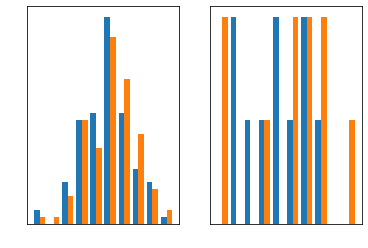

In [96]:
fig, axs = plt.subplots(1,2)
axs[0].hist(ML_perts[0])
axs[1].hist(ML_perts[1])

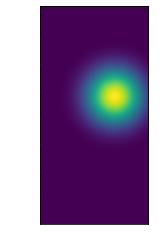

In [65]:
plt.imshow(GC)

(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

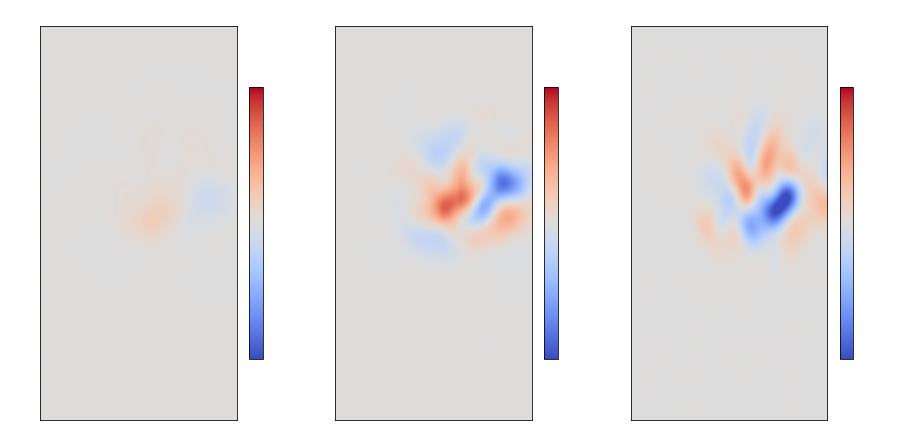

In [85]:
imshow3(ML_XY[:,0].reshape(3, 2048, 1024), eta_vlim=0.01, huv_vlim=0.1)

In [124]:
l_idx = 1

X0 = ML_state[l_idx][0]
X0mean = np.average(X0, axis=-1)
X1 = ML_state[l_idx][1].repeat(2,1).repeat(2,2)
X1mean = np.average(X1, axis=-1)

Y0 = ML_state[l_idx][0][obs_var,obs_idxs[l_idx][0][0],obs_idxs[l_idx][0][1]] + ML_perts[l_idx].T
Y0mean = np.average(Y0, axis=-1)
Y1 = ML_state[l_idx][1][obs_var,obs_idxs[l_idx][1][0],obs_idxs[l_idx][1][1]] + ML_perts[l_idx].T
Y1mean = np.average(Y1, axis=-1)

lvl_weight = relax_factor * np.tile(block_reduce(GC, block_size=(2**(numLevels-l_idx-1),2**(numLevels-l_idx-1)), func=np.mean).flatten(),3)

ML_XY1 = (lvl_weight[:,np.newaxis] 
            * ( 1/Nes[l_idx]
                *( (X0-X0mean[:,:,:,np.newaxis]).reshape(-1,X0.shape[-1]) 
                    @ (Y0 - Y0mean[:,np.newaxis]).T) 
                - 1/Nes[l_idx]
                *( (X1-X1mean[:,:,:,np.newaxis]).reshape(-1,X1.shape[-1]) 
                    @ (Y1 - Y1mean[:,np.newaxis]).T) 
            )
        ).reshape(X0mean.shape + (obs_varN,)).repeat(2**(numLevels-l_idx-1),1).repeat(2**(numLevels-l_idx-1),2).reshape(-1,ML_XY.shape[-1])


(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

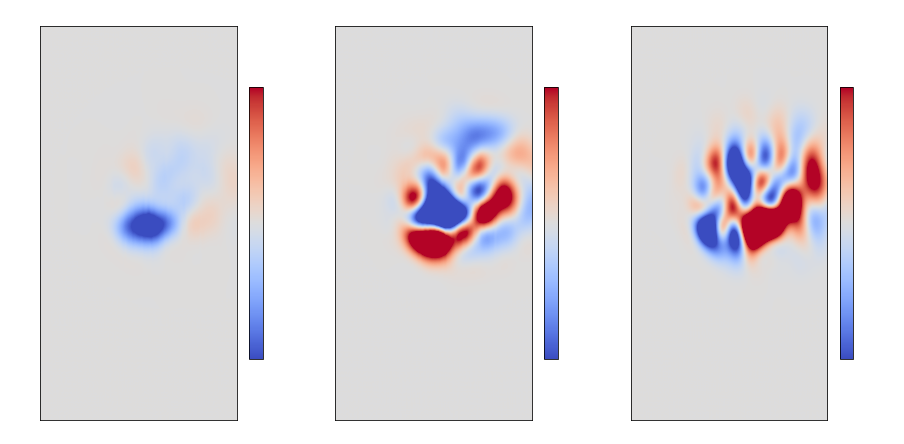

In [86]:
imshow3(ML_XY1[:,0].reshape(3, 2048, 1024), eta_vlim=0.01, huv_vlim=0.1)

(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

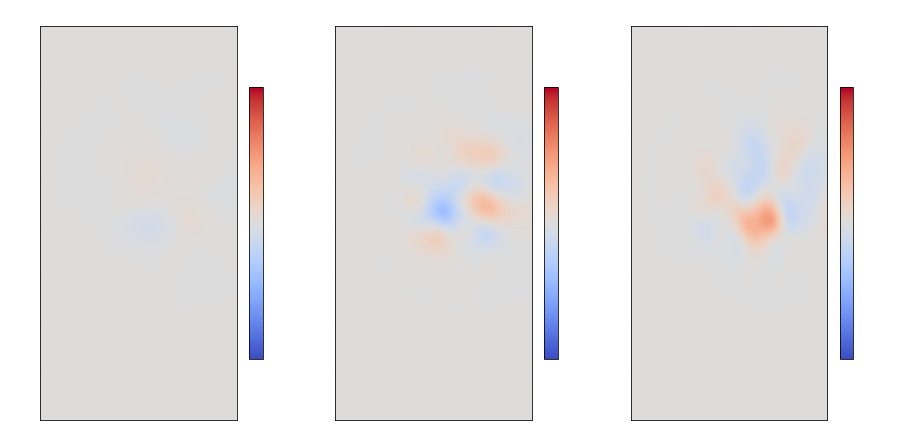

In [87]:
imshow3((lvl_weight[:,np.newaxis]*1/Nes[l_idx]*( (X0-X0mean[:,:,:,np.newaxis]).reshape(-1,X0.shape[-1]) @ (Y0 - Y0mean[:,np.newaxis]).T) )[:,0].reshape(3, 2048, 1024), eta_vlim=0.01, huv_vlim=0.1)


(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

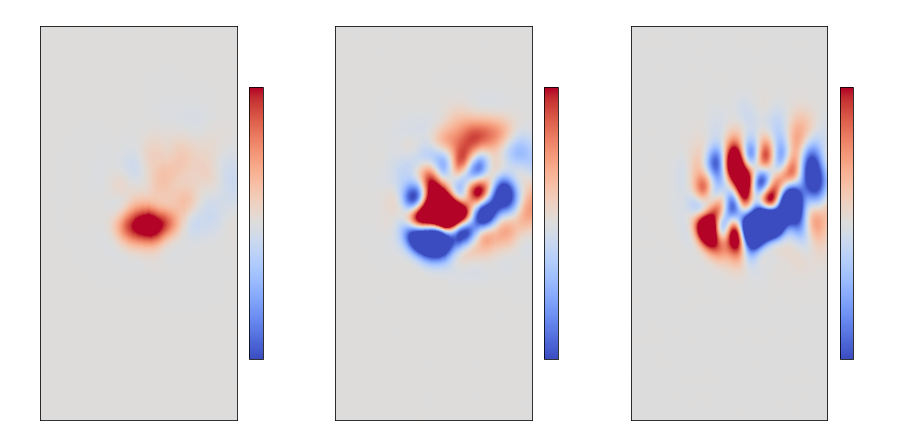

In [88]:
imshow3((lvl_weight[:,np.newaxis]*1/Nes[l_idx]*( (X1-X1mean[:,:,:,np.newaxis]).reshape(-1,X1.shape[-1]) @ (Y1 - Y1mean[:,np.newaxis]).T) )[:,0].reshape(3, 2048, 1024), eta_vlim=0.01, huv_vlim=0.1)


In [99]:
Y0

array([[-17.87653556, -17.83491533, -17.69723391, -17.86955872,
        -17.79008787, -17.76627482, -17.81511643, -17.91877703,
        -17.88093045, -17.82320242],
       [-10.09617031,  -9.94182894, -10.12640087, -10.03945167,
        -10.07593655,  -9.89531159,  -9.89968433,  -9.92842978,
         -9.92637534,  -9.8579197 ]])

In [105]:
Y0 - Y0mean[:,np.newaxis]

array([[-0.0492723 , -0.00765207,  0.13002934, -0.04229547,  0.03717538,
         0.06098844,  0.01214683, -0.09151377, -0.0536672 ,  0.00406083],
       [-0.1174194 ,  0.03692196, -0.14764996, -0.06070076, -0.09718564,
         0.08343932,  0.07906658,  0.05032113,  0.05237557,  0.12083121]])

(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

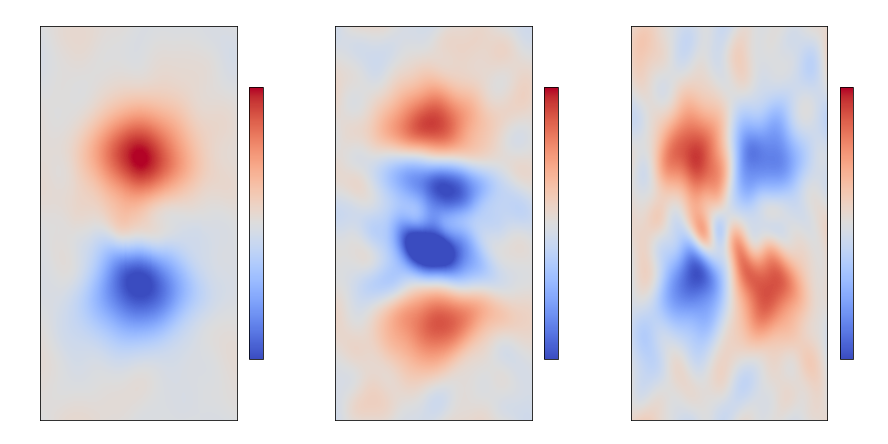

In [98]:
imshow3(X0mean)

(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

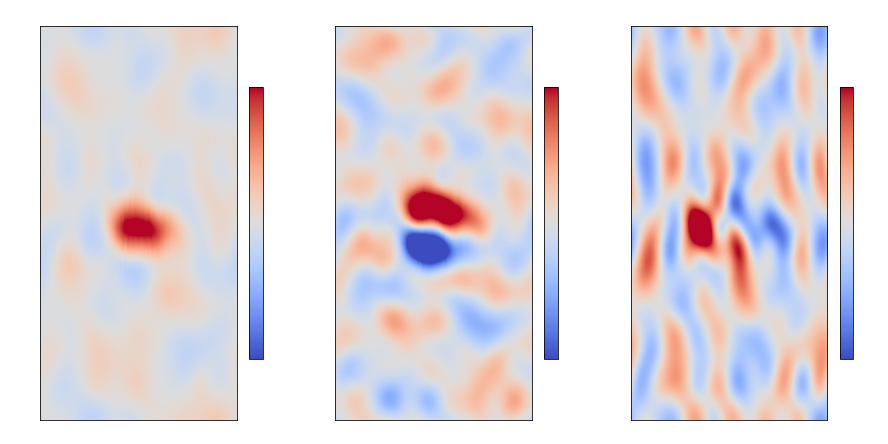

In [128]:
imshow3((X0-X0mean[:,:,:,np.newaxis])[:,:,:,0])

In [100]:
Y1

array([[-18.06023803, -17.18194406, -17.67652583, -18.28746453,
        -18.42072027, -17.05661906, -17.38258316, -17.98511271,
        -18.02701047, -18.05854826],
       [-10.08854759,  -9.96305106, -10.12341683, -10.02499874,
        -10.06132149,  -9.92370056,  -9.91901149,  -9.9126007 ,
         -9.92468066,  -9.85017778]])

In [104]:
Y1 - Y1mean[:,np.newaxis]

array([[-0.24656139,  0.63173258,  0.13715081, -0.47378789, -0.60704363,
         0.75705758,  0.43109348, -0.17143607, -0.21333383, -0.24487163],
       [-0.1093969 ,  0.01609963, -0.14426614, -0.04584805, -0.0821708 ,
         0.05545013,  0.0601392 ,  0.06654999,  0.05447002,  0.12897291]])

(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

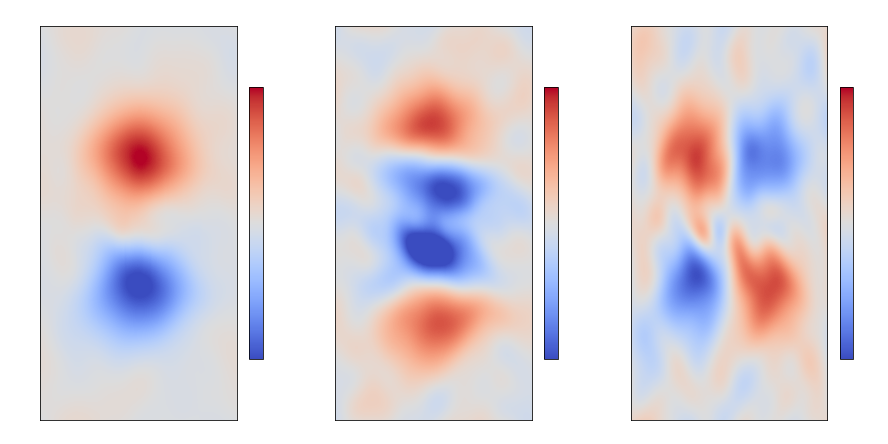

In [97]:
imshow3(X1mean)

(<Figure size 1080x720 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

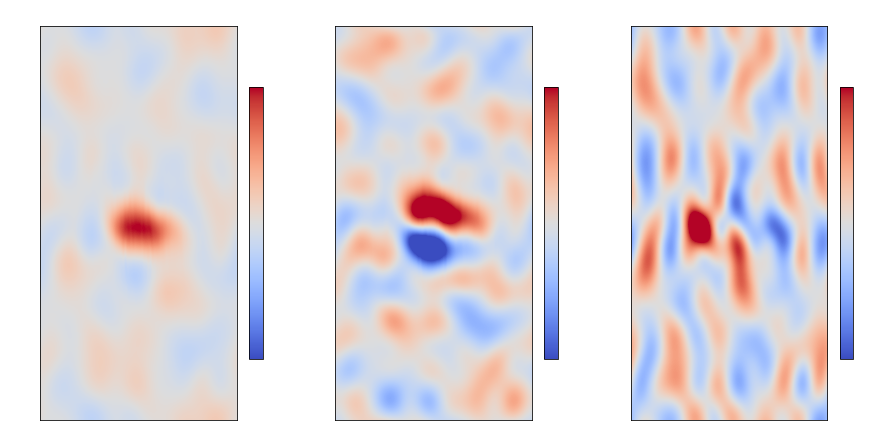

In [127]:
imshow3((X1-X1mean[:,:,:,np.newaxis])[:,:,:,0])

In [102]:
Hx, Hy

(700, 1200)

In [101]:
obs_idxs

[[600, 350], [[1200, 700], [600, 350]]]

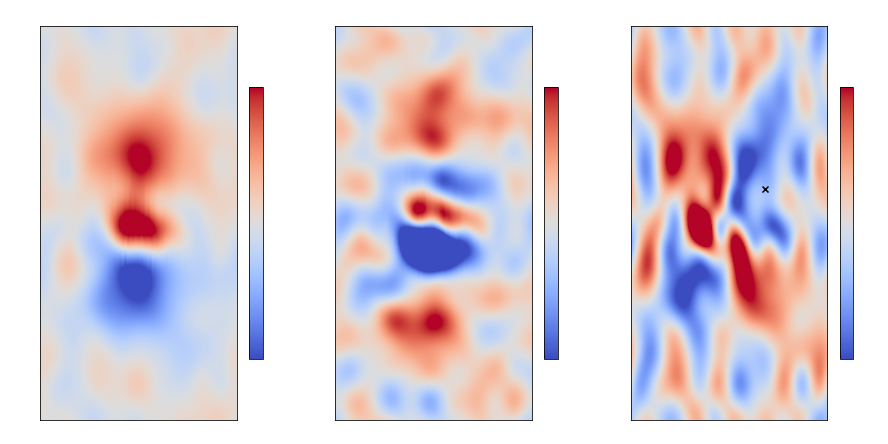

In [119]:
fig, axs = imshow3(MLOceanEnsemble.ML_ensemble[1][0][0].download(interior_domain_only=True))
axs[2].scatter(obs_idxs[1][0][1], obs_idxs[1][0][0], marker="x", color="black")

In [122]:
np.array(MLOceanEnsemble.ML_ensemble[1][0][0].download(interior_domain_only=True))[1,obs_idxs[1][0][0], obs_idxs[1][0][1]]

-17.83654

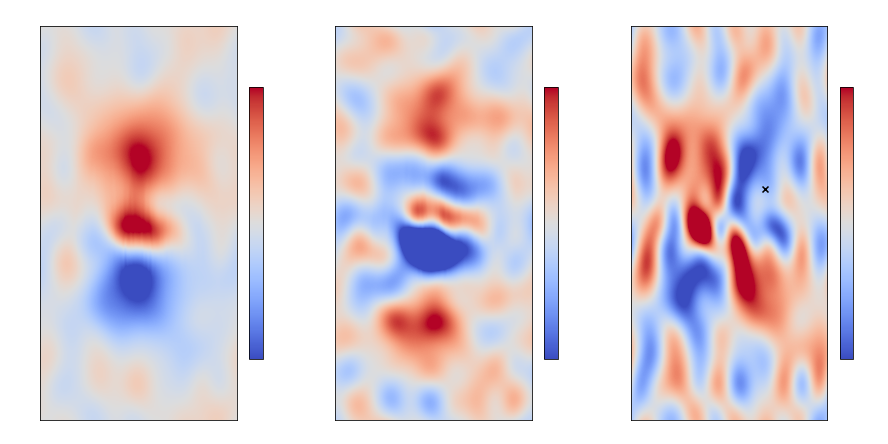

In [117]:
fig, axs = imshow3(MLOceanEnsemble.ML_ensemble[1][1][0].download(interior_domain_only=True))
axs[2].scatter(obs_idxs[1][1][1], obs_idxs[1][1][0], marker="x", color="black")

In [123]:
np.array(MLOceanEnsemble.ML_ensemble[1][1][0].download(interior_domain_only=True))[1,obs_idxs[1][1][0], obs_idxs[1][1][1]]

-18.020243

In [129]:
ML_XY = ML_XY + ML_XY1

In [130]:
ML_HXY = ML_XY.reshape(ML_state[-1][0].shape[:-1] + (obs_varN,))[obs_var,obs_idxs[-1][0][0],obs_idxs[-1][0][1],:]
ML_HXY

array([[-0.00291838,  0.00134473],
       [-0.00017926,  0.00072848]])

In [137]:
ML_YY  = ML_HXY + np.diag(R[obs_var])
ML_YY

array([[ 0.00208162,  0.00134473],
       [-0.00017926,  0.00572848]])

In [143]:
np.linalg.inv(ML_YY)

513.2613361371646

In [139]:
np.linalg.inv(ML_YY + np.eye(2))

array([[ 9.97922463e-01, -1.33429082e-03],
       [ 1.77863764e-04,  9.94303909e-01]])

In [144]:
np.linalg.inv(np.diag(R[obs_var]))

282.842712474619